# Project 2: Exploring NYC Subway and Bus Data

The goal of this project is to be able to predict more accurately NYC subway and bus arrivals. I have frequently felt that, especially for buses, that the NYC apps have frequently underestimated the amount of time it takes to arrive at a particular bus stop. Our goal is to rectify that by using the live feeds to get a better sense of such dynamics.

Through this project, I hope to be able to accomplish the following objectives - 1) Learn how to retrieve and analyze GTFS location-based data, 2) use supervised and unsupervised algorithms to predict arrival times, 3) continue to work on visualizing data in an effective manner.

# Retrieving Subway GTFS Data

The first thing is to figure out how to retrieve subway / bus data. GTFS data can be retrieved by suing the following Python Code, as documented in Google Developer docs (https://developers.google.com/transit/gtfs-realtime/code-samples?hl=en):

In [1]:
from google.transit import gtfs_realtime_pb2
import urllib

key = 'c03800d91e3319d3d2559da23bf1337f'
feed = gtfs_realtime_pb2.FeedMessage()
response = urllib.urlopen('http://datamine.mta.info/mta_esi.php?key='+key+'&feed_id=1')
feed.ParseFromString(response.read())
for entity in feed.entity:
  if entity.HasField('trip_update'):
    print entity.trip_update

trip {
  trip_id: "123050_1..S02R"
  start_date: "20160218"
  route_id: "1"
}
stop_time_update {
  departure {
    time: 1455845430
  }
  stop_id: "101S"
}
stop_time_update {
  arrival {
    time: 1455845520
  }
  departure {
    time: 1455845520
  }
  stop_id: "103S"
}
stop_time_update {
  arrival {
    time: 1455845610
  }
  departure {
    time: 1455845610
  }
  stop_id: "104S"
}
stop_time_update {
  arrival {
    time: 1455845700
  }
  departure {
    time: 1455845700
  }
  stop_id: "106S"
}
stop_time_update {
  arrival {
    time: 1455845790
  }
  departure {
    time: 1455845790
  }
  stop_id: "107S"
}
stop_time_update {
  arrival {
    time: 1455845850
  }
  departure {
    time: 1455845850
  }
  stop_id: "108S"
}
stop_time_update {
  arrival {
    time: 1455845940
  }
  departure {
    time: 1455845940
  }
  stop_id: "109S"
}
stop_time_update {
  arrival {
    time: 1455846030
  }
  departure {
    time: 1455846030
  }
  stop_id: "110S"
}
stop_time_update {
  arrival {
    time

In [2]:
for stop_time in feed.entity[30].trip_update.stop_time_update:
    print stop_time

# Tracking MTA Bus Information

The MTA Bus time updates real-time information in JSON format, and lays out specific parameters we can input in order to filter the data. The following code retrieves information on any bus line in real-time:

In [3]:
import json
def getBusLineRealTimeData(line_code, direction):
    prefix = 'http://api.prod.obanyc.com/api/siri/vehicle-monitoring.json?'
    key = '5347ec91-8b26-42ab-9b06-0dc84d71eabf'
    version = '2'
    detail = 'calls'
    url = prefix + 'key=' + key + '&version=' + version + '&LineRef=MTA%20NYCT_' + line_code + \
          '&VehicleMonitoringDetailLevel=' + detail + '&DirectionRef=' + str(direction)
    data = urllib.urlopen(url).read().decode('utf-8')
    return json.loads(data)


With this, you can obtain all the buses on a particular bus line, and their estimated future arrivals. The following is example code for the M42 line that travels across 42nd St.

In [4]:
from datetime import datetime

def getPredictionInfoForLine(line_code,direction):
    #print line_code
    data = getBusLineRealTimeData(line_code, direction)
    time_updated = datetime.strptime(data['Siri']['ServiceDelivery']['ResponseTimestamp'][:-10],'%Y-%m-%dT%H:%M:%S')
    vehicle_data = data['Siri']['ServiceDelivery']['VehicleMonitoringDelivery'][0]['VehicleActivity']
    master_data = dict() 
    for i,vehicle in enumerate(vehicle_data):
        vehicle_id = vehicle['MonitoredVehicleJourney']['VehicleRef']
        bus_data = []
        if 'OnwardCall' not in vehicle['MonitoredVehicleJourney']['OnwardCalls']:
            continue
        for potential_stop in vehicle['MonitoredVehicleJourney']['OnwardCalls']['OnwardCall']:
            # No Arrival Time means it's already there so we set it as 0 seconds
            temp = []
            try:
                temp = [potential_stop['NumberOfStopsAway'], potential_stop['DistanceFromStop'], potential_stop['StopPointName'][0], \
                  datetime.strptime(potential_stop['ExpectedArrivalTime'][:-10],'%Y-%m-%dT%H:%M:%S'),\
                  datetime.strptime(potential_stop['ExpectedArrivalTime'][:-10],'%Y-%m-%dT%H:%M:%S')-time_updated]
            except:
                temp = [potential_stop['NumberOfStopsAway'], potential_stop['DistanceFromStop'], potential_stop['StopPointName'][0], \
                  time_updated,time_updated-time_updated]
            bus_data.append(temp)
        master_data[vehicle_id] = bus_data
    return time_updated, master_data

getPredictionInfoForLine('M11',1)

(datetime.datetime(2016, 2, 18, 22, 34, 10),
 {u'MTA NYCT_6391': [[0,
    159,
    u'W 135 ST/RIVERSIDE DR',
    datetime.datetime(2016, 2, 18, 22, 34, 19),
    datetime.timedelta(0, 9)],
   [1,
    377,
    u'W 135 ST/BROADWAY',
    datetime.datetime(2016, 2, 18, 22, 35, 25),
    datetime.timedelta(0, 75)],
   [2,
    588,
    u'W 135 ST/AMSTERDAM AV',
    datetime.datetime(2016, 2, 18, 22, 36, 19),
    datetime.timedelta(0, 129)],
   [3,
    738,
    u'AMSTERDAM AV/W 134 ST',
    datetime.datetime(2016, 2, 18, 22, 37, 10),
    datetime.timedelta(0, 180)],
   [4,
    984,
    u'AMSTERDAM AV/W 131 ST',
    datetime.datetime(2016, 2, 18, 22, 38, 9),
    datetime.timedelta(0, 239)],
   [5,
    1130,
    u'AMSTERDAM AV/W 129 ST',
    datetime.datetime(2016, 2, 18, 22, 38, 43),
    datetime.timedelta(0, 273)],
   [6,
    1386,
    u'AMSTERDAM AV/W 125 ST',
    datetime.datetime(2016, 2, 18, 22, 39, 59),
    datetime.timedelta(0, 349)],
   [7,
    1619,
    u'AMSTERDAM AV/W 123 ST',
    dat

In [5]:
import time
def getDataforBusLine(line_code, num_seconds,direction):
    wait = 30
    intervals = num_seconds/wait
    master_data = dict()
    for i in range(0,intervals):   
        time_updated,data = getPredictionInfoForLine(line_code,direction)
        for bus_id, bus_data in data.iteritems():
            for stop_predict in bus_data:
                distance = stop_predict[1]
                stop_name = stop_predict[2]
                time_predicted = stop_predict[3]
                time_delta = stop_predict[4]
                if str(bus_id + '_' + stop_name) not in master_data:
                    master_data[bus_id + '_' + stop_name] = [[distance,time_predicted]]
                else:
                    if master_data[bus_id + '_' + stop_name][-1][0] != distance:
                        master_data[bus_id + '_' + stop_name].append([distance, time_predicted])
        #if i != intervals-1:
        time.sleep(30)
    return master_data

In [9]:
import time
def getDataforBusLines(line_codes, directions, num_seconds):
    tic=timeit.default_timer()
    wait = 30
    intervals = num_seconds/wait
    master_data = dict()
    for line_code,direction in zip(line_codes,directions):
        master_data[line_code + '_' + str(direction)] = dict()
    for i in range(0,intervals):
        #if i % 30 == 0:
         #   print str(30./60/60*i)+ ' hours passed' 
        all_data = [getPredictionInfoForLine(x,y) for x,y in zip(line_codes,directions)]
        for j,data in enumerate(all_data):
            for bus_id, bus_data in data[1].iteritems():
                for stop_predict in bus_data:
                    distance = stop_predict[1]
                    stop_name = stop_predict[2]
                    time_predicted = stop_predict[3]
                    time_delta = stop_predict[4]
                    if str(bus_id + '_' + stop_name) not in master_data[line_codes[j]+'_'+str(directions[j])]:
                        master_data[line_codes[j]+'_'+str(directions[j])][str(bus_id + '_' + stop_name)] = [[distance,time_predicted]]
                    else:
                        #print master_data[line_codes[j]+'_'+str(directions[j])][str(bus_id + '_' + stop_name)]
                        if master_data[line_codes[j]+'_'+str(directions[j])][str(bus_id + '_' + stop_name)][-1][0] != distance:
                            master_data[line_codes[j]+'_'+str(directions[j])][str(bus_id + '_' + stop_name)].append([distance, time_predicted])
    toc=timeit.default_timer()
    #if i != intervals-1:
    time.sleep(max(30-(toc-tic),0))
    return master_data

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
def generateDataFrame(master_data):
    organized_data = []
    for bus_and_stop, predictions in master_data.iteritems():
        if predictions[-1][0] < 50:
            actual_arrival_time = predictions[-1][1]
            for prediction in predictions:
                distance = prediction[0]
                delta = actual_arrival_time - prediction[1]
                diff = delta.total_seconds()
                organized_data.append([bus_and_stop,distance,diff,prediction[1],actual_arrival_time])                
    return pd.DataFrame(organized_data,columns=['Vehicle and Stop','Distance in Meters','Difference in Seconds',\
                                                'Predicted Arrival', 'Actual Arrival'])

In [8]:
def generateDataFrames(master_data,ignore_first_stop_num):
    dataframes = dict()
    threshold = 50
    for bus_direction,data in master_data.iteritems():
        organized_data = []
        for bus_and_stop, predictions in data.iteritems():
            start = 0
            end = 0
            for i,prediction in enumerate(predictions):
                if i != 0 and prediction[0] > predictions[i-1][0] and predictions[i-1][0] < threshold:
                    test_end = start
                    while test_end < i and predictions[test_end][0] > threshold:
                        test_end = test_end + 1
                    actual_arrival_time = predictions[test_end][1]
                    end = min(test_end + 1,i)
                    for block in predictions[start+ignore_first_stop_num:end]:
                        distance = block[0]
                        delta = actual_arrival_time - block[1]
                        diff = delta.total_seconds()
                        organized_data.append([bus_and_stop,distance,diff,block[1],actual_arrival_time]) 
                    start = end
        dataframes[bus_direction] = pd.DataFrame(organized_data,columns=['Vehicle and Stop','Distance in Meters', \
                                                                         'Difference in Seconds','Predicted Arrival', 'Actual Arrival'])
    return dataframes

In [10]:
#106,98
import timeit
import cPickle
all_bus_nums = [1,2,3,4,5,7,8,9,10,11,12,'14A','14D',15,'15%2B',20,21,22,23,31,'34%2B','34A%2B',35,42,50,57,'60%2B',66,72,79,'86%2B',96,100,101,102,103,104,116]
all_bus_lines = ['M'+str(x) for x in all_bus_nums]
all_lines = [j for i in zip(all_bus_lines,all_bus_lines) for j in i]
zeros = [0]*len(all_bus_nums)
ones = [1]*len(all_bus_nums)
directions = [j for i in zip(zeros,ones) for j in i]
all_scrape_data = []
for i in range(0,2*60*24):
    if i % 30 == 0:
        print str(i/120.) + " Hours passed"
    try:
        all_scrape_data.append(getDataforBusLines(all_lines,directions,30))
    except:
        print "couldn't get data at " + str(i/120.) + " hours."
        
cPickle.dump(all_scrape_data, open('save.p', 'wb')) 

#all_bus_data = generateDataFrames(scrape_data,2)

0.0 Hours passed


In [197]:
def getTerminalStop(line_code,direction):
    print line_code, direction
    data = getBusLineRealTimeData(line_code, direction)
    vehicle_data = data['Siri']['ServiceDelivery']['VehicleMonitoringDelivery'][0]['VehicleActivity']
    return vehicle_data[0]['MonitoredVehicleJourney']['DestinationName'][0]

all_terminal_stops = [getTerminalStop(x,y) for x,y in zip(all_lines,directions)]

In [219]:
import numpy as np
import scipy.stats as stats
import statsmodels.api as sm
%matplotlib inline

hfont = {'fontname':'Arial'}
labelsize = 13
ticksize = 11
titlesize = 15

def plotLineData(all_bus_data,line,direction,begin,end,terminal_stop,threshold_dist,threshold_time):
    begin = datetime.strptime(begin,'%Y-%m-%d %H:%M:%S')
    end = datetime.strptime(end,'%Y-%m-%d %H:%M:%S')
    final_data = all_bus_data[line+'_'+str(direction)]
    clean_data = final_data[(final_data['Actual Arrival'] > begin) & (final_data['Actual Arrival'] < end)]
    clean_data['Vehicle'] = [x.rsplit('_',1)[0] for x in clean_data['Vehicle and Stop'].values]
    X = clean_data['Distance in Meters']
    y = clean_data['Difference in Seconds']/60
    regression_x = []
    regression_y = []
    
    #a,intercept,_,_,stderr = stats.linregress(X,y)
    figure = plt.figure(figsize=(10,6))

    plot_data_x = []
    plot_data_y = []
    old_id = clean_data['Vehicle and Stop'].values[0]
    stop_arrivals_recorded = 0   
    for i,vehicle_id in enumerate(clean_data['Vehicle and Stop'].values):
        if vehicle_id != old_id or (i != 0 and clean_data['Distance in Meters'].values[i] > clean_data['Distance in Meters'].values[i-1]):
            plot_data_x, plot_data_y = (np.array(t) for t in zip(*sorted(zip(plot_data_x, plot_data_y))))
            # Check if Predictions are Super Unreasonable
            reasonable = True
            for x,y in zip(plot_data_x,plot_data_y):
                if x < threshold_dist and y > threshold_time:
                    reasonable = False
            if plot_data_y[0] == 0 and sum(plot_data_y > 20) == 0 and reasonable:
                plt.plot(plot_data_x,plot_data_y, '-g', linewidth = 0.5)
                stop_arrivals_recorded = stop_arrivals_recorded + 1
                regression_x += list(plot_data_x)
                regression_y += list(plot_data_y)
            plot_data_x = []
            plot_data_y = []
        #if vehicle_id == 'MTA NYCT_3925_W 58 ST/BROADWAY':
         #   print i, clean_data['Distance in Meters'].values[i],clean_data['Difference in Seconds'].values[i]/60
        plot_data_x.append(clean_data['Distance in Meters'].values[i])
        plot_data_y.append(clean_data['Difference in Seconds'].values[i]/60)
        old_id = vehicle_id

    model = sm.OLS(regression_y, regression_x)
    results = model.fit()
    estimate = results.params[0]
    stderr = results.params[0]/results.tvalues[0]
    plt.plot(np.array(regression_x), estimate*np.array(regression_x), '-g', ms=3.5, linewidth = 1)
        
    plt.xlabel('\n Distance from Stop (in Meters)',fontsize=labelsize, **hfont)
    plt.ylabel('\n Lateness (in Minutes)',fontsize=labelsize, **hfont)
    plt.tick_params(labelsize=ticksize)
    plt.title('\nMTA Bus Time Prediction Performance - ' + terminal_stop \
              + ' Bound ' + line + ' Bus\n',fontsize=titlesize, **hfont)
    print line + ' - ' + terminal_stop + ':'
    print 'Set of Stop Arrival Predictions Collected: ' + str(stop_arrivals_recorded)
    print 'Incremental Lateness in Seconds per Kilometer: ' + str(round(estimate*1000*60,2)) 
    print '95% Confidence Interval of Incremental Lateness: [' + str(round((estimate-1.645*stderr)*1000*60,2)) + \
                                                        ', ' + str(round((estimate+1.645*stderr)*1000*60,2)) + ']'
    plt.show()

M1 - HARLEM 147 ST via MADISON:
Set of Stop Arrival Predictions Collected: 114
Incremental Lateness in Seconds per Kilometer: -21.77
95% Confidence Interval of Incremental Lateness: [-22.61, -20.92]


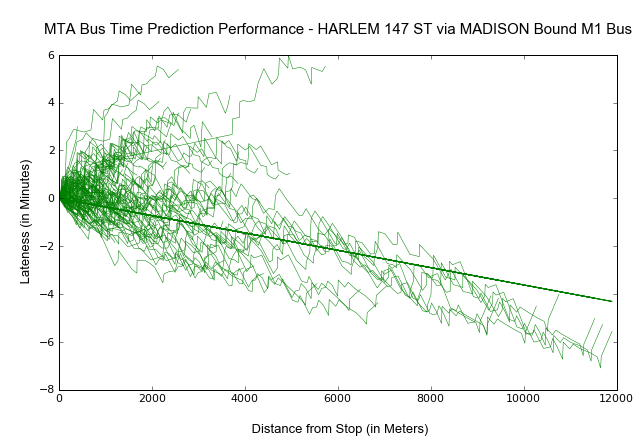

M1 - E VILLAGE 8 ST via 5 AV:
Set of Stop Arrival Predictions Collected: 75
Incremental Lateness in Seconds per Kilometer: 28.82
95% Confidence Interval of Incremental Lateness: [26.46, 31.18]


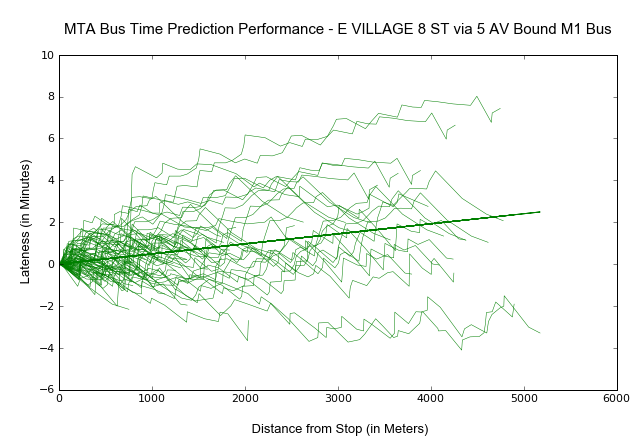

M2 - WASHINGTON HTS BWAY - 168 ST via MADISON:
Set of Stop Arrival Predictions Collected: 90
Incremental Lateness in Seconds per Kilometer: -7.82
95% Confidence Interval of Incremental Lateness: [-8.97, -6.67]


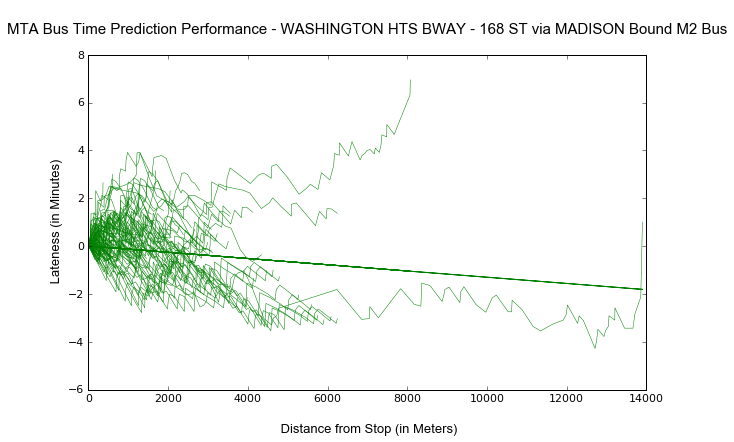

M2 - EAST VILLAGE 8 ST via 5 AV:
Set of Stop Arrival Predictions Collected: 86
Incremental Lateness in Seconds per Kilometer: 16.85
95% Confidence Interval of Incremental Lateness: [15.12, 18.58]


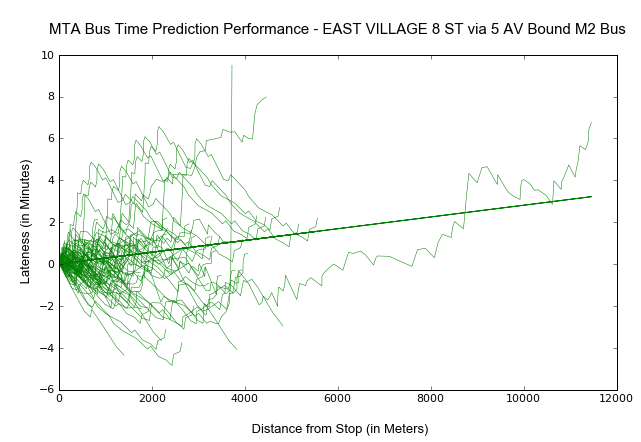

M3 - FT GEORGE 193 ST via MADSON via ST. NICH:
Set of Stop Arrival Predictions Collected: 89
Incremental Lateness in Seconds per Kilometer: 15.07
95% Confidence Interval of Incremental Lateness: [13.45, 16.68]


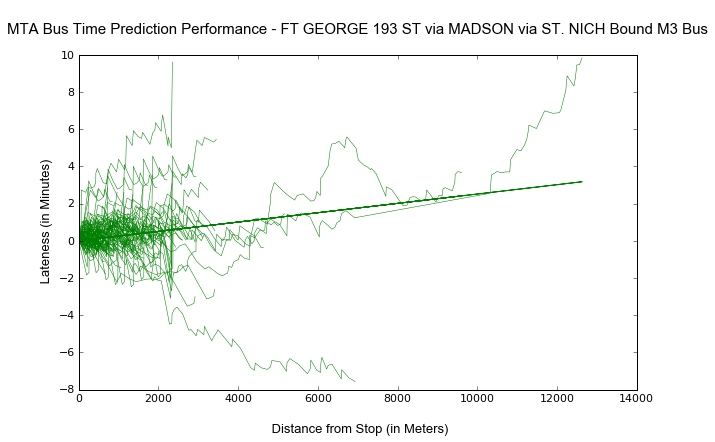

M3 - EAST VILLAGE 8 ST via 5 AV:
Set of Stop Arrival Predictions Collected: 114
Incremental Lateness in Seconds per Kilometer: 9.94
95% Confidence Interval of Incremental Lateness: [8.91, 10.97]


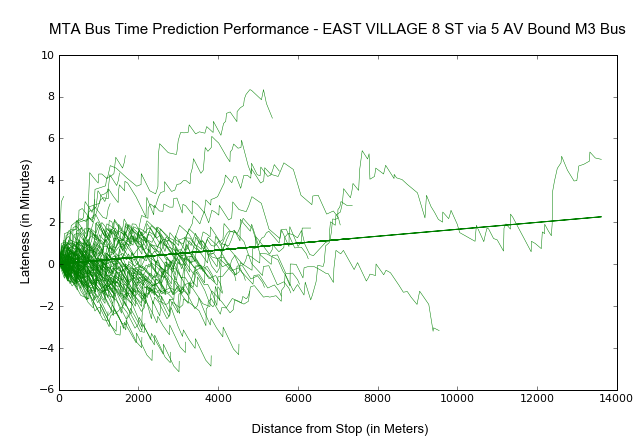

M4 - WASH HTS CABRINI BLV via MADSON via BWAY:
Set of Stop Arrival Predictions Collected: 79
Incremental Lateness in Seconds per Kilometer: 22.39
95% Confidence Interval of Incremental Lateness: [20.95, 23.83]


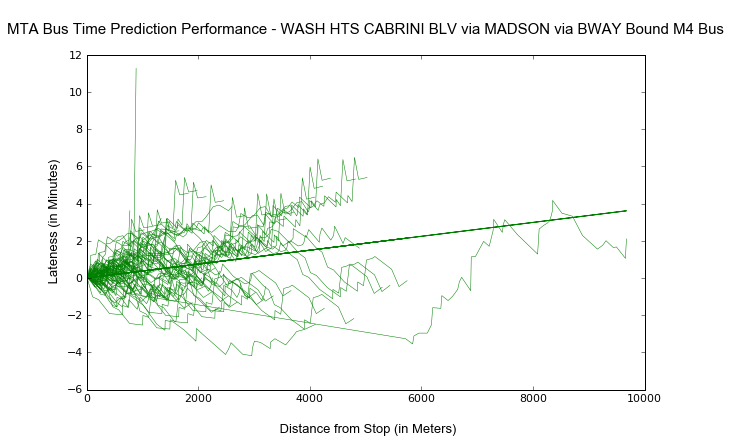

M4 - MIDTOWN PENN STA via BROADWAY via 5 AV:
Set of Stop Arrival Predictions Collected: 54
Incremental Lateness in Seconds per Kilometer: 20.77
95% Confidence Interval of Incremental Lateness: [19.07, 22.46]


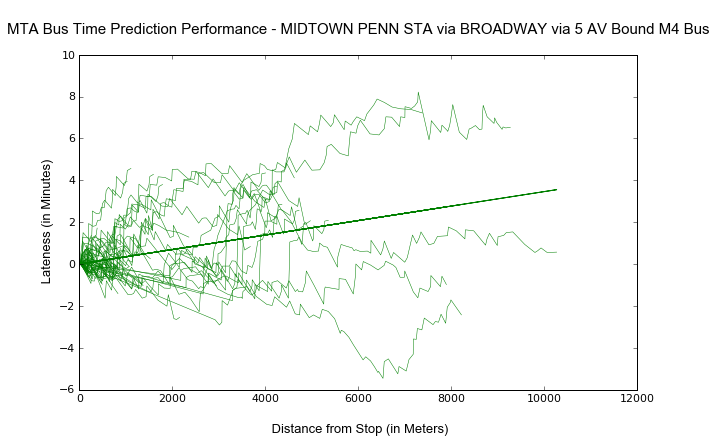

M5 - WASHINGTON HTS - GW BRIDGE:
Set of Stop Arrival Predictions Collected: 27
Incremental Lateness in Seconds per Kilometer: -8.41
95% Confidence Interval of Incremental Lateness: [-10.57, -6.25]


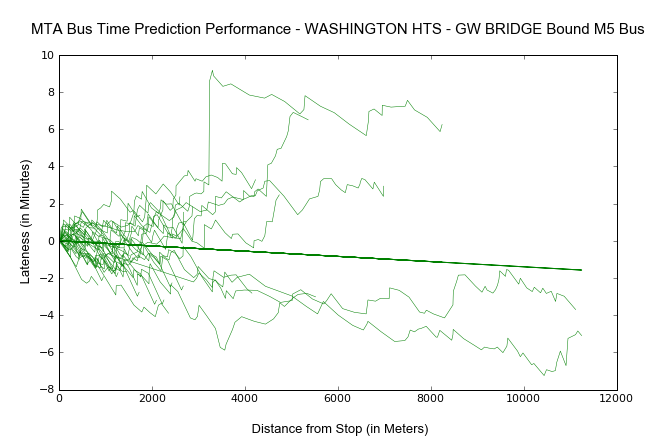

M5 - SOUTH FERRY via 5AV/BROADWAY:
Set of Stop Arrival Predictions Collected: 29
Incremental Lateness in Seconds per Kilometer: 16.52
95% Confidence Interval of Incremental Lateness: [14.9, 18.14]


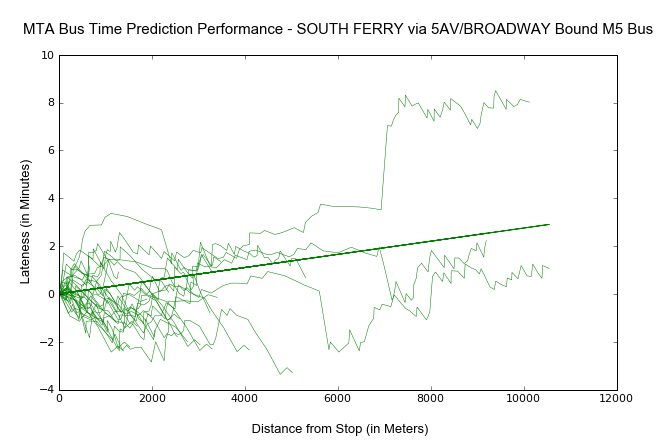

M7 - HARLEM 147 ST via 6 AV via AMSTERDAM:
Set of Stop Arrival Predictions Collected: 123
Incremental Lateness in Seconds per Kilometer: -6.84
95% Confidence Interval of Incremental Lateness: [-8.1, -5.58]


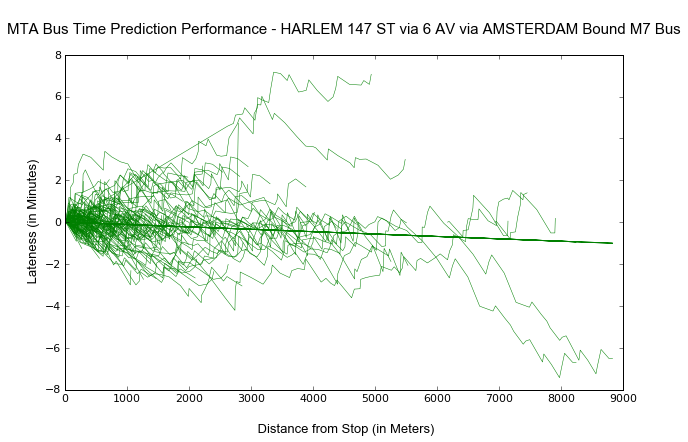

M7 - 14 ST via COLUMBUS via 7 AV:
Set of Stop Arrival Predictions Collected: 31
Incremental Lateness in Seconds per Kilometer: -15.48
95% Confidence Interval of Incremental Lateness: [-18.76, -12.2]


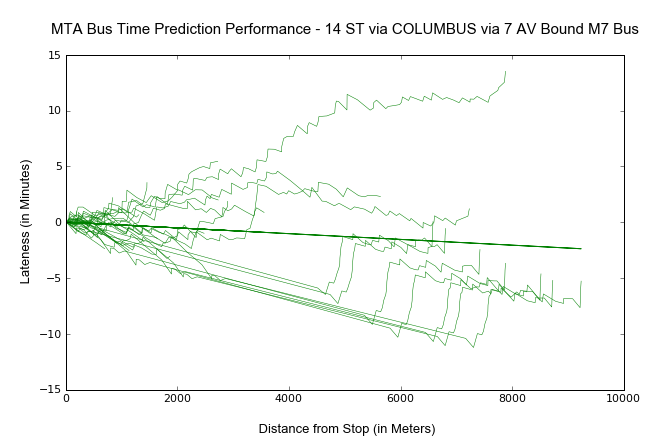

M8 - AVENUE "D" CROSSTOWN:
Set of Stop Arrival Predictions Collected: 55
Incremental Lateness in Seconds per Kilometer: 133.75
95% Confidence Interval of Incremental Lateness: [122.92, 144.58]


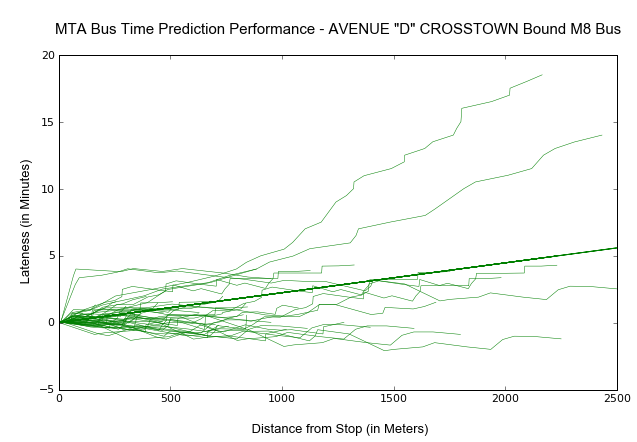

M8 - WEST ST CROSSTOWN:
Set of Stop Arrival Predictions Collected: 25
Incremental Lateness in Seconds per Kilometer: 12.64
95% Confidence Interval of Incremental Lateness: [9.49, 15.79]


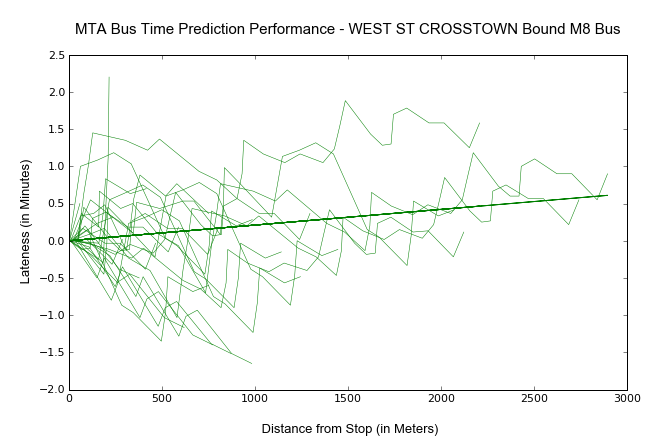

M9 - KIPS BAY 1 AV - 26 ST via AV C:
Set of Stop Arrival Predictions Collected: 35
Incremental Lateness in Seconds per Kilometer: 68.88
95% Confidence Interval of Incremental Lateness: [66.54, 71.23]


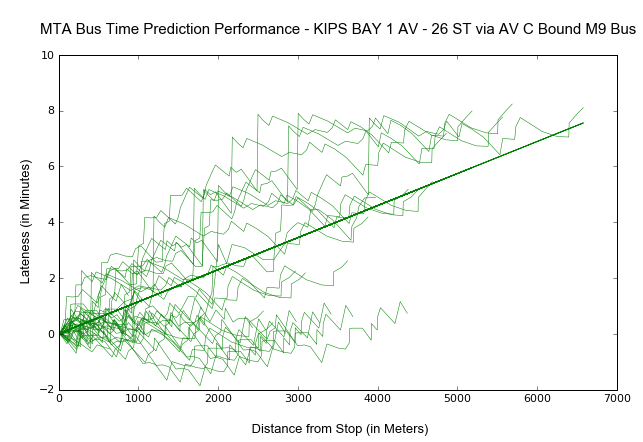

M9 - BATTERY PK CITY via AV C via PARK ROW:
Set of Stop Arrival Predictions Collected: 36
Incremental Lateness in Seconds per Kilometer: -2.37
95% Confidence Interval of Incremental Lateness: [-4.15, -0.59]


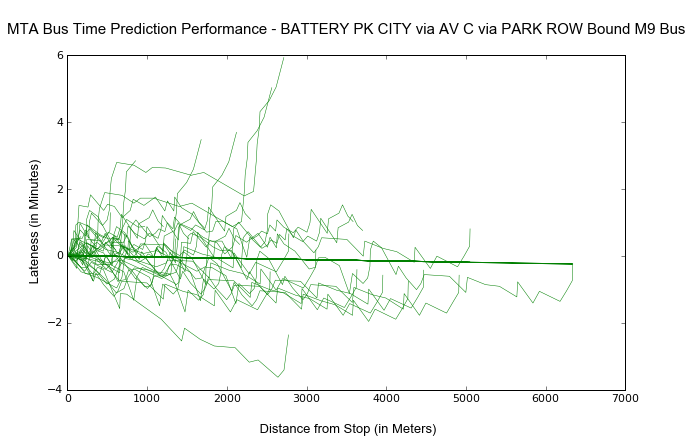

M10 - HARLEM 159 ST via 8 AV:
Set of Stop Arrival Predictions Collected: 142
Incremental Lateness in Seconds per Kilometer: 6.83
95% Confidence Interval of Incremental Lateness: [5.21, 8.45]


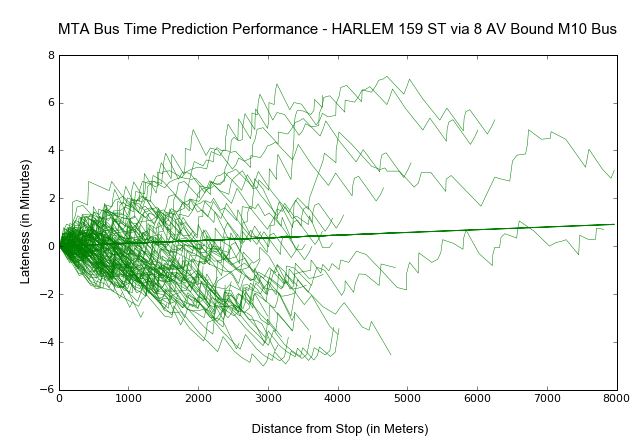

M10 - COLUMBUS CIRCLE via CENTRAL PARK W.:
Set of Stop Arrival Predictions Collected: 182
Incremental Lateness in Seconds per Kilometer: 55.08
95% Confidence Interval of Incremental Lateness: [54.3, 55.86]


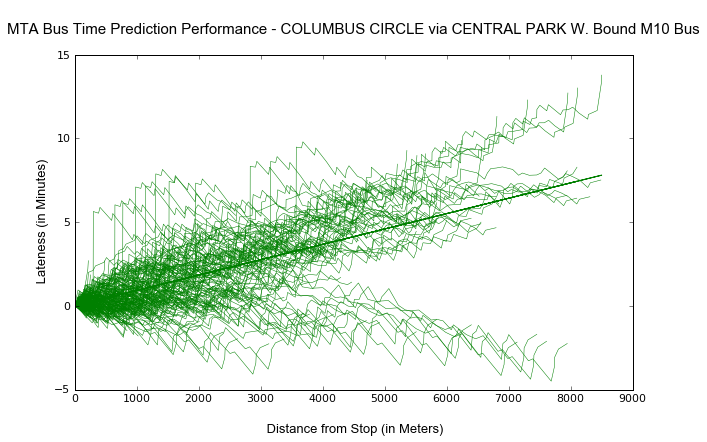

M11 - RIVERBANK 145 ST via 10 AV:
Set of Stop Arrival Predictions Collected: 83
Incremental Lateness in Seconds per Kilometer: 7.0
95% Confidence Interval of Incremental Lateness: [4.54, 9.47]


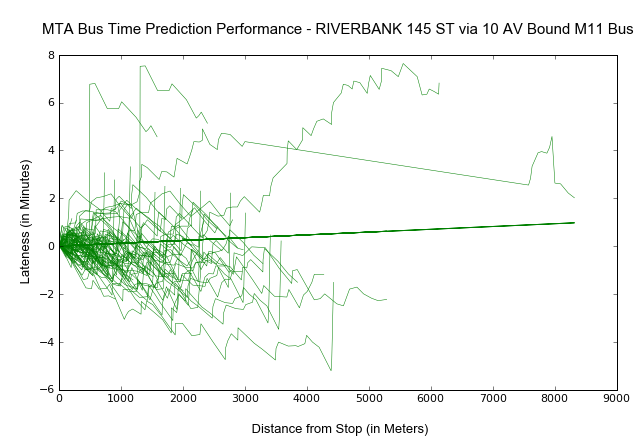

M11 - WEST VILL ABINGDON SQ via 9 AV:
Set of Stop Arrival Predictions Collected: 93
Incremental Lateness in Seconds per Kilometer: 10.75
95% Confidence Interval of Incremental Lateness: [7.32, 14.17]


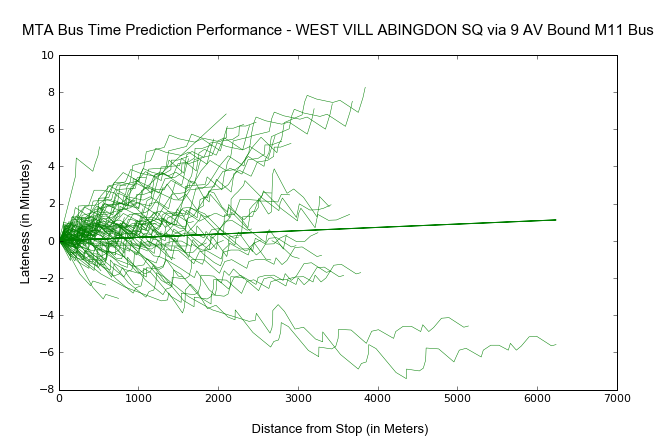

M12 - MIDTOWN WEST - COLUMBUS CIR:
Set of Stop Arrival Predictions Collected: 24
Incremental Lateness in Seconds per Kilometer: -24.91
95% Confidence Interval of Incremental Lateness: [-31.7, -18.13]


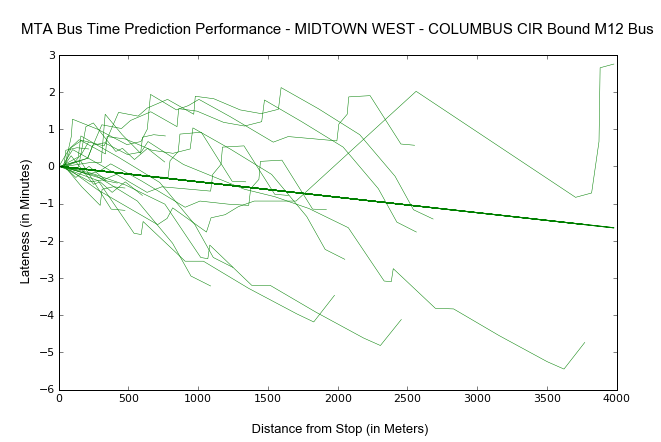

M12 - WEST VILLAGE - ABINGDON SQ:
Set of Stop Arrival Predictions Collected: 47
Incremental Lateness in Seconds per Kilometer: 72.51
95% Confidence Interval of Incremental Lateness: [69.23, 75.78]


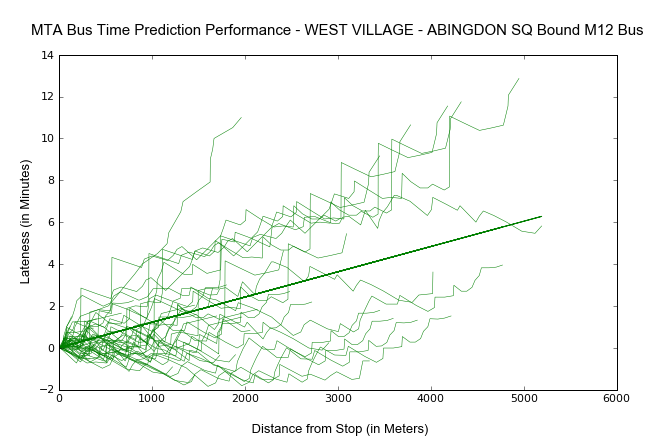

M14A - LOWER E. SIDE GRAND-FDR CROSSTOWN:
Set of Stop Arrival Predictions Collected: 163
Incremental Lateness in Seconds per Kilometer: 7.04
95% Confidence Interval of Incremental Lateness: [5.82, 8.26]


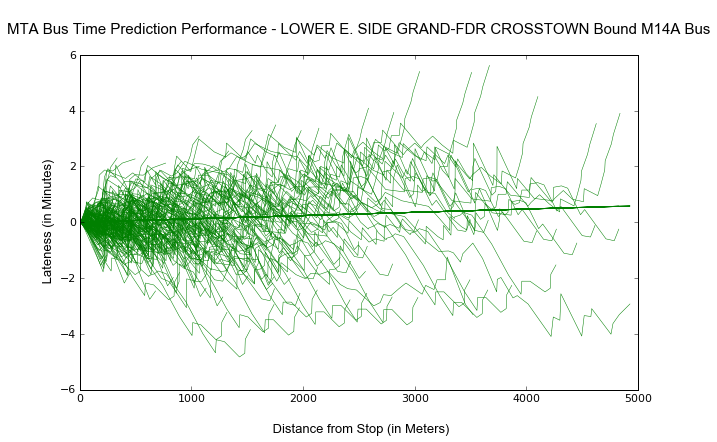

M14A - ABINGDON SQ CROSSTOWN:
Set of Stop Arrival Predictions Collected: 142
Incremental Lateness in Seconds per Kilometer: 14.02
95% Confidence Interval of Incremental Lateness: [11.8, 16.24]


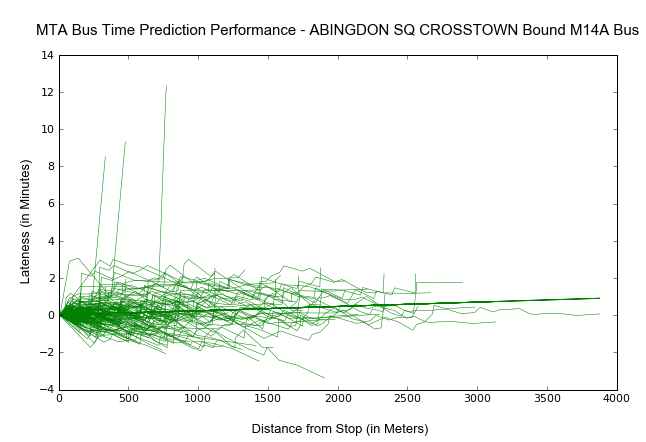

M14D - LOWER E. SIDE DELANCY-FDR CROSSTOWN:
Set of Stop Arrival Predictions Collected: 264
Incremental Lateness in Seconds per Kilometer: 27.51
95% Confidence Interval of Incremental Lateness: [26.34, 28.68]


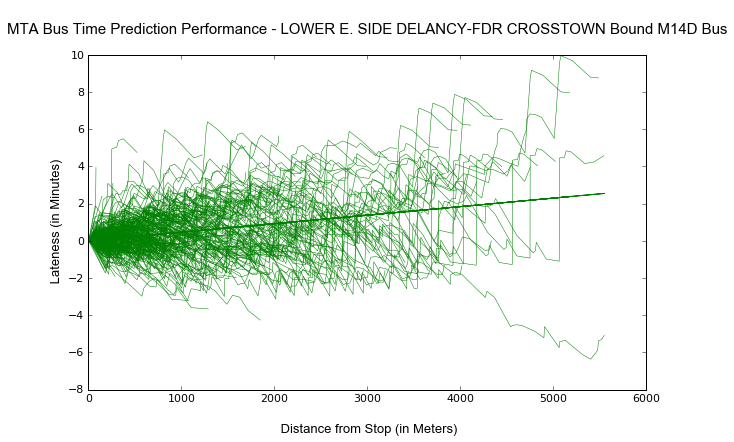

M14D - CHELSEA PIERS 11 AV CROSSTOWN:
Set of Stop Arrival Predictions Collected: 212
Incremental Lateness in Seconds per Kilometer: 63.42
95% Confidence Interval of Incremental Lateness: [60.31, 66.52]


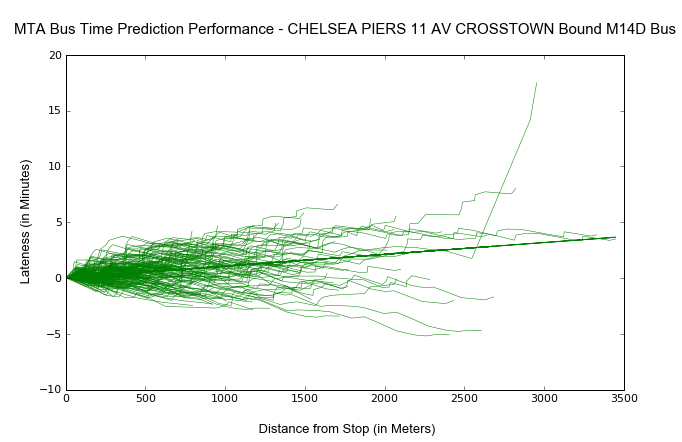

M15 - EAST HARLEM 125 ST via 1 AV:
Set of Stop Arrival Predictions Collected: 60
Incremental Lateness in Seconds per Kilometer: 78.69
95% Confidence Interval of Incremental Lateness: [76.27, 81.11]


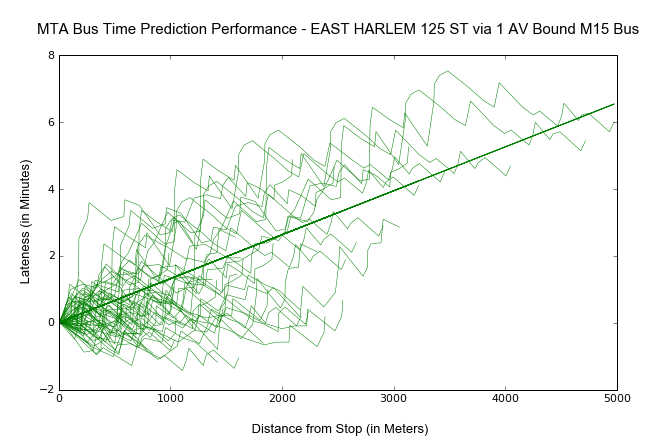

M15 - SOUTH FERRY via 2 AV:
Set of Stop Arrival Predictions Collected: 104
Incremental Lateness in Seconds per Kilometer: -0.93
95% Confidence Interval of Incremental Lateness: [-4.05, 2.18]


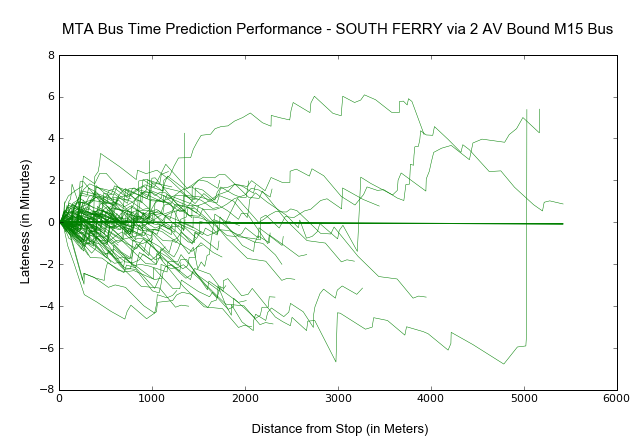

M15%2B - SELECT BUS SERVICE 125ST via 1 AV:
Set of Stop Arrival Predictions Collected: 104
Incremental Lateness in Seconds per Kilometer: 27.01
95% Confidence Interval of Incremental Lateness: [25.83, 28.2]


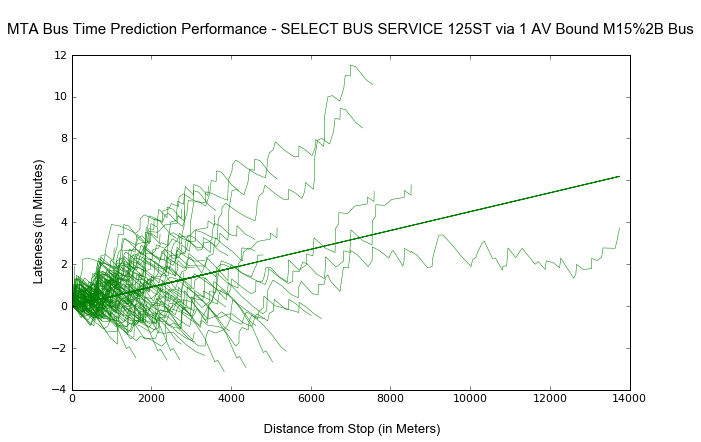

M15%2B - SELECT BUS SERVICE SOUTH FERRY via 2 AV:
Set of Stop Arrival Predictions Collected: 128
Incremental Lateness in Seconds per Kilometer: -8.88
95% Confidence Interval of Incremental Lateness: [-10.23, -7.54]


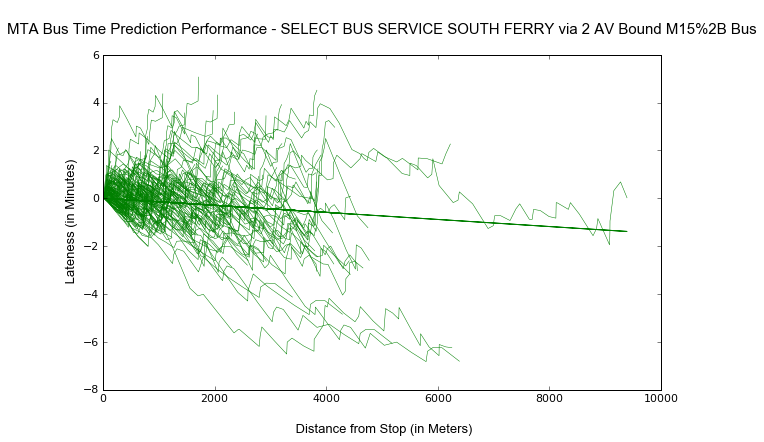

M20 - LINCOLN CENTER 66 ST via 8 AV:
Set of Stop Arrival Predictions Collected: 63
Incremental Lateness in Seconds per Kilometer: 20.7
95% Confidence Interval of Incremental Lateness: [17.4, 24.0]


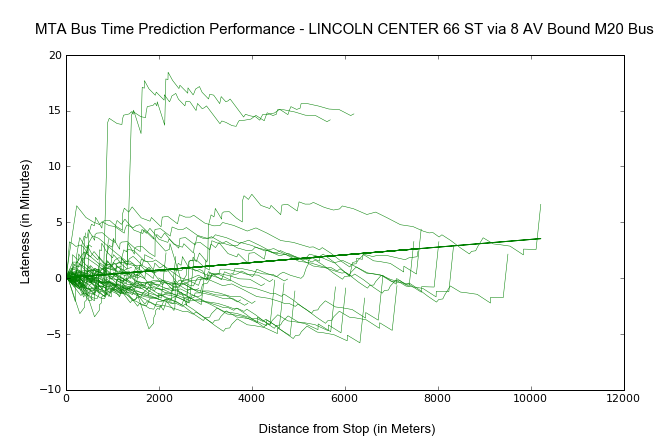

M20 - SOUTH FERRY via 7 AV via BAT PK CITY:
Set of Stop Arrival Predictions Collected: 43
Incremental Lateness in Seconds per Kilometer: -22.77
95% Confidence Interval of Incremental Lateness: [-24.87, -20.66]


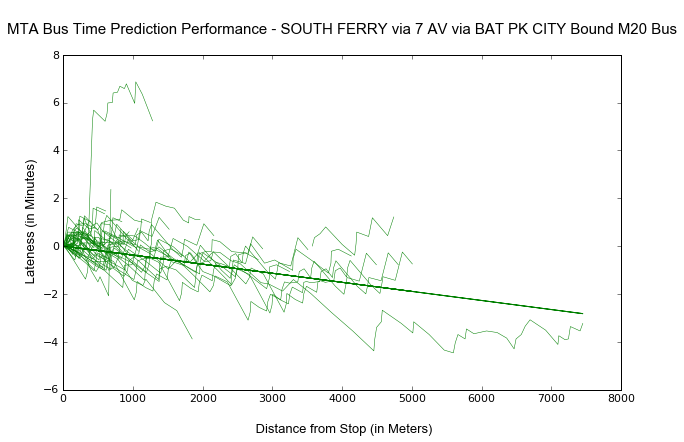

M21 - LOWER E SIDE GRAND-FDR CROSSTOWN:
Set of Stop Arrival Predictions Collected: 44
Incremental Lateness in Seconds per Kilometer: 58.73
95% Confidence Interval of Incremental Lateness: [55.03, 62.44]


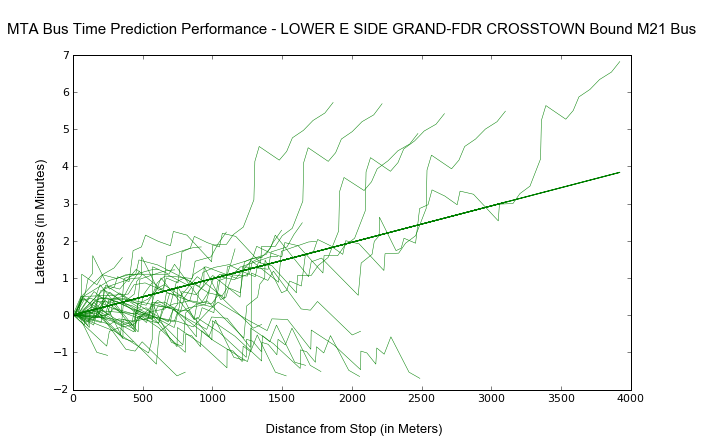

M21 - SOHO SPRING ST CROSSTOWN:
Set of Stop Arrival Predictions Collected: 29
Incremental Lateness in Seconds per Kilometer: 16.72
95% Confidence Interval of Incremental Lateness: [10.85, 22.6]


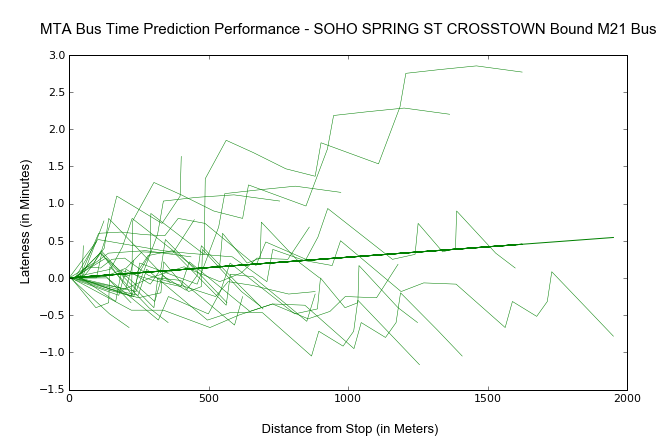

M22 - LOWER E. SIDE FDR DR:
Set of Stop Arrival Predictions Collected: 54
Incremental Lateness in Seconds per Kilometer: 76.19
95% Confidence Interval of Incremental Lateness: [72.77, 79.61]


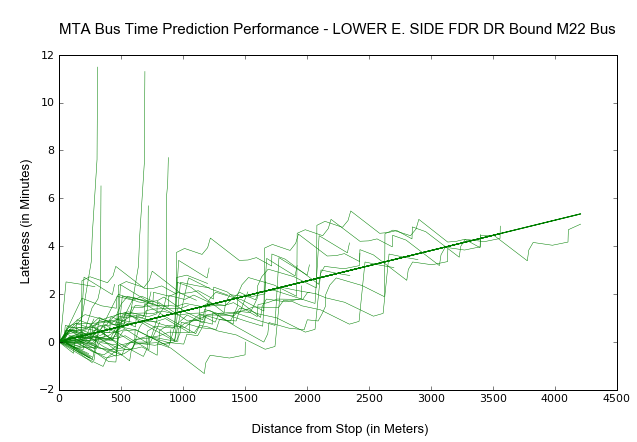

M22 - BATTERY PK CTY:
Set of Stop Arrival Predictions Collected: 49
Incremental Lateness in Seconds per Kilometer: -1.93
95% Confidence Interval of Incremental Lateness: [-4.91, 1.05]


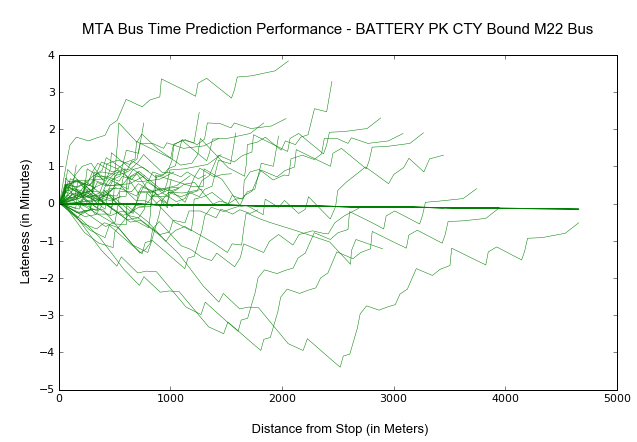

M23 - EAST SIDE FDR DR CROSSTOWN:
Set of Stop Arrival Predictions Collected: 88
Incremental Lateness in Seconds per Kilometer: 47.71
95% Confidence Interval of Incremental Lateness: [44.19, 51.22]


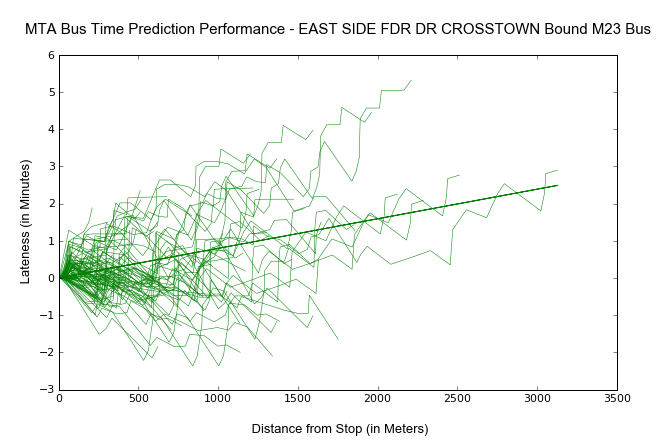

M23 - CHELSEA PIERS 12 AV CROSSTOWN:
Set of Stop Arrival Predictions Collected: 107
Incremental Lateness in Seconds per Kilometer: -15.92
95% Confidence Interval of Incremental Lateness: [-18.36, -13.47]


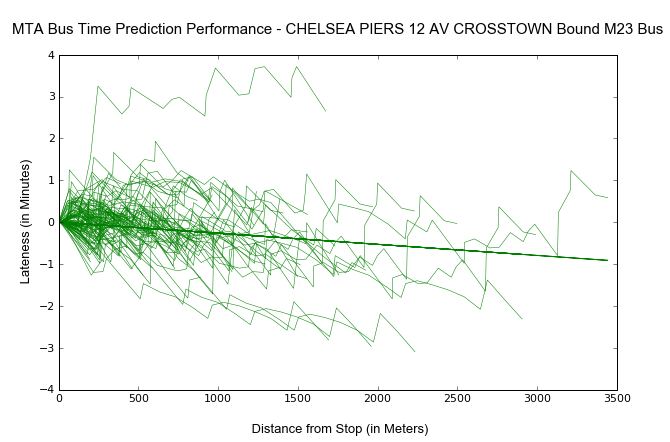

M31 - YORKVILLE 91 ST via YORK AV:
Set of Stop Arrival Predictions Collected: 153
Incremental Lateness in Seconds per Kilometer: 41.26
95% Confidence Interval of Incremental Lateness: [39.66, 42.86]


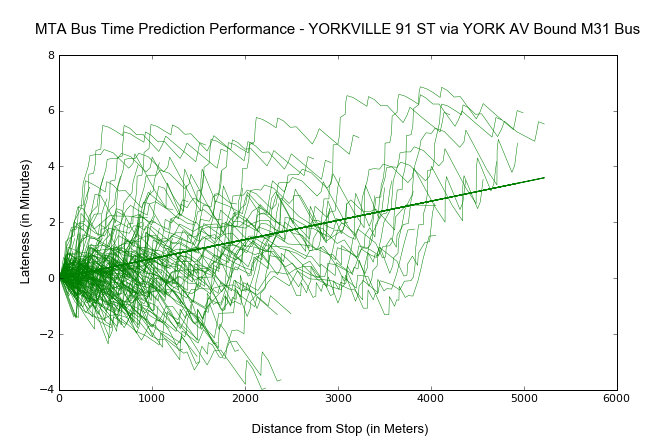

M31 - CLINTON 11 AV via 57 ST:
Set of Stop Arrival Predictions Collected: 151
Incremental Lateness in Seconds per Kilometer: -4.2
95% Confidence Interval of Incremental Lateness: [-6.12, -2.29]


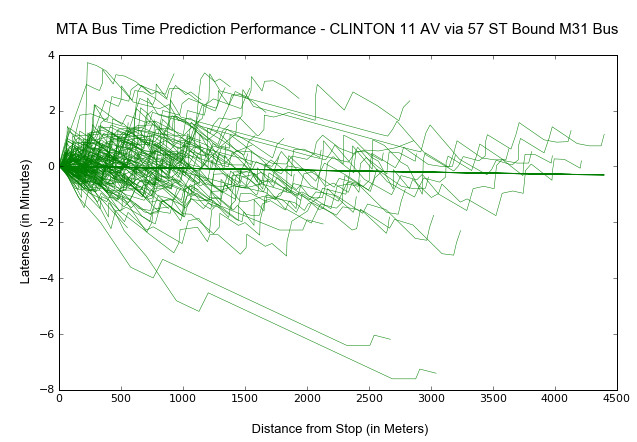

M34%2B - SELECT BUS SERVICE Eastside - FDR DR:
Set of Stop Arrival Predictions Collected: 55
Incremental Lateness in Seconds per Kilometer: 15.04
95% Confidence Interval of Incremental Lateness: [12.65, 17.43]


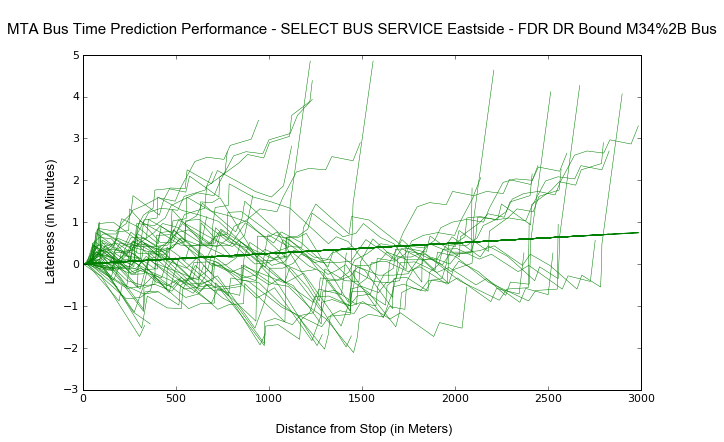

M34%2B - SELECT BUS SERVICE JAVITS CTR - 12 AV:
Set of Stop Arrival Predictions Collected: 51
Incremental Lateness in Seconds per Kilometer: 10.1
95% Confidence Interval of Incremental Lateness: [6.9, 13.3]


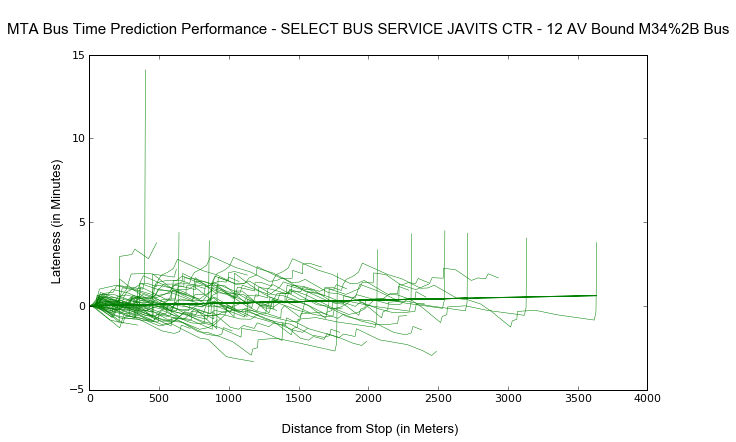

M34A%2B - WATERSIDE VIA 34 ST VIA 2 AV:
Set of Stop Arrival Predictions Collected: 61
Incremental Lateness in Seconds per Kilometer: -51.26
95% Confidence Interval of Incremental Lateness: [-55.89, -46.64]


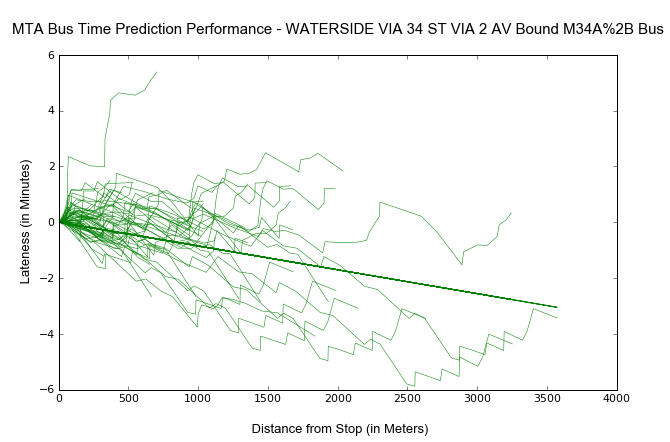

M34A%2B - PA BUS TERMINAL VIA 34 ST VIA 8 AV:
Set of Stop Arrival Predictions Collected: 52
Incremental Lateness in Seconds per Kilometer: 39.89
95% Confidence Interval of Incremental Lateness: [26.06, 53.72]


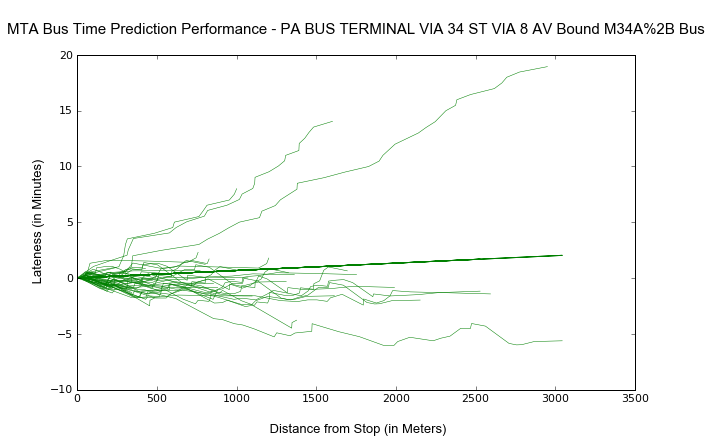

M35 - WARDS ISLAND:
Set of Stop Arrival Predictions Collected: 43
Incremental Lateness in Seconds per Kilometer: 17.56
95% Confidence Interval of Incremental Lateness: [15.32, 19.79]


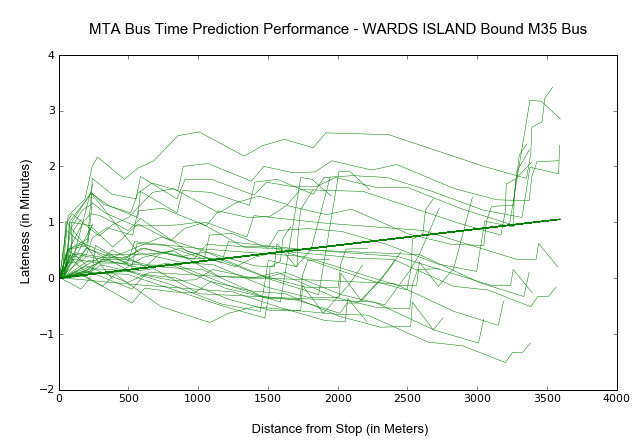

M35 - HARLEM LEX AV - 125 ST:
Set of Stop Arrival Predictions Collected: 26
Incremental Lateness in Seconds per Kilometer: -4.47
95% Confidence Interval of Incremental Lateness: [-6.99, -1.95]


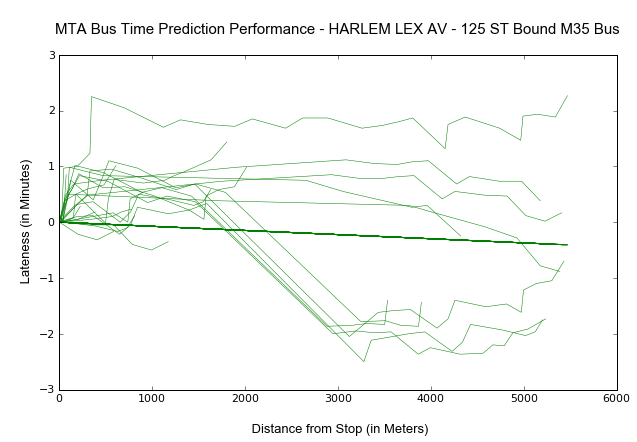

M42 - UN - 1 AV CROSSTOWN:
Set of Stop Arrival Predictions Collected: 111
Incremental Lateness in Seconds per Kilometer: -12.0
95% Confidence Interval of Incremental Lateness: [-15.35, -8.65]


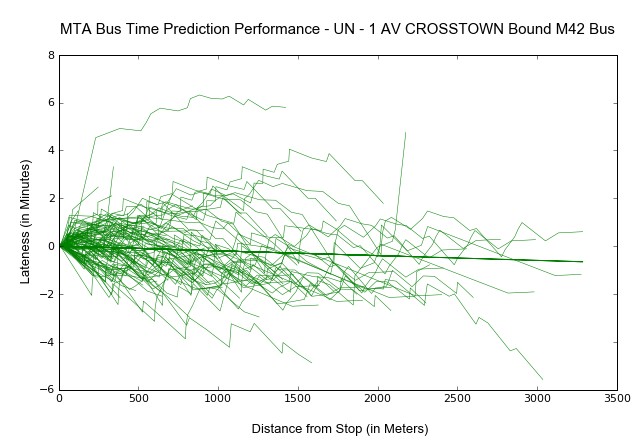

M42 - 42 ST PIER CROSSTOWN:
Set of Stop Arrival Predictions Collected: 101
Incremental Lateness in Seconds per Kilometer: -10.57
95% Confidence Interval of Incremental Lateness: [-15.08, -6.05]


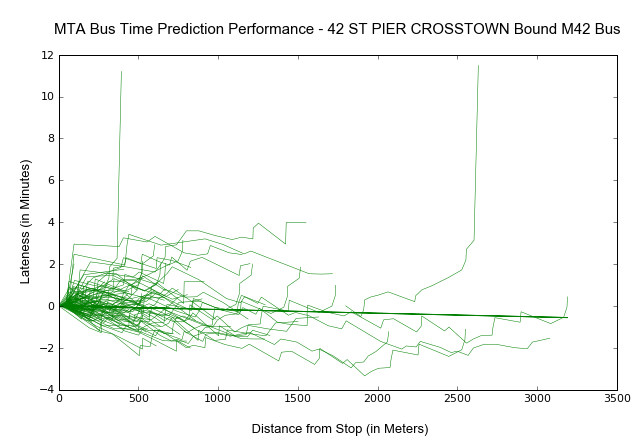

M50 - E 49 ST & 1 AV:
Set of Stop Arrival Predictions Collected: 25
Incremental Lateness in Seconds per Kilometer: 4.63
95% Confidence Interval of Incremental Lateness: [-0.82, 10.08]


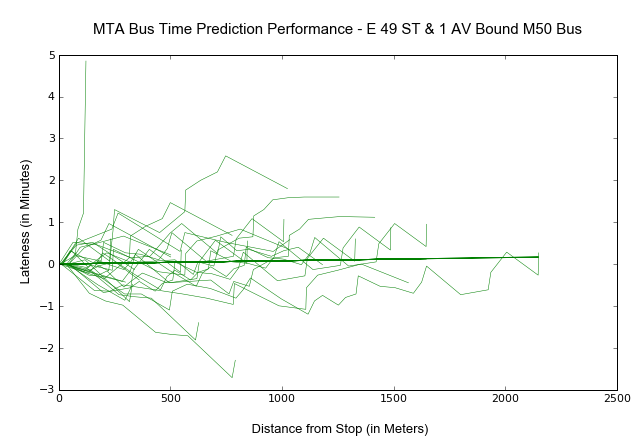

M50 - WEST SIDE 42 ST PIER CROSSTOWN:
Set of Stop Arrival Predictions Collected: 18
Incremental Lateness in Seconds per Kilometer: -11.35
95% Confidence Interval of Incremental Lateness: [-16.92, -5.78]


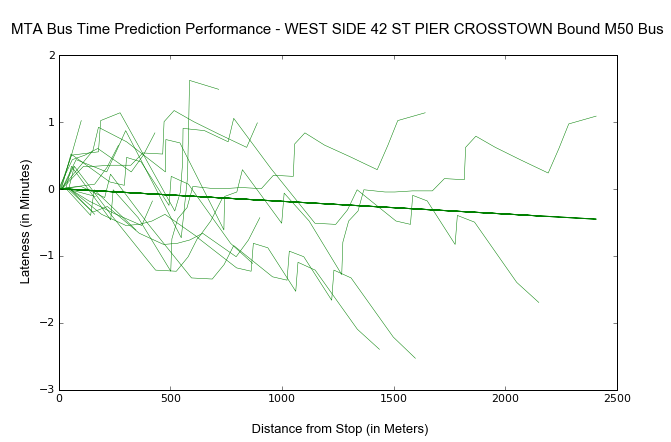

M57 - EAST SIDE YORK - 60 ST XTOWN:
Set of Stop Arrival Predictions Collected: 81
Incremental Lateness in Seconds per Kilometer: 22.23
95% Confidence Interval of Incremental Lateness: [18.02, 26.43]


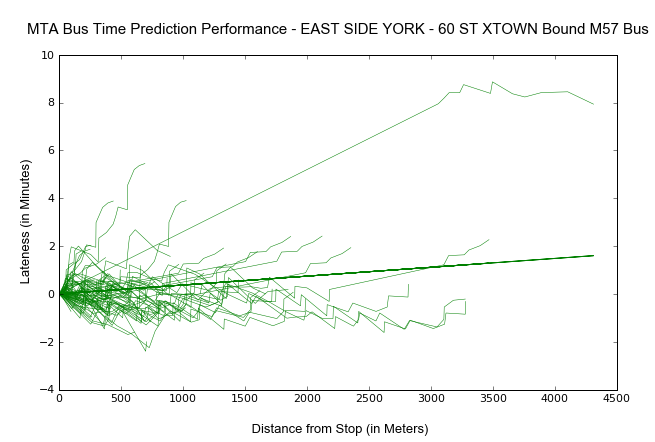

M57 - WEST SIDE BWAY - 72 ST XTOWN:
Set of Stop Arrival Predictions Collected: 94
Incremental Lateness in Seconds per Kilometer: 18.33
95% Confidence Interval of Incremental Lateness: [13.84, 22.81]


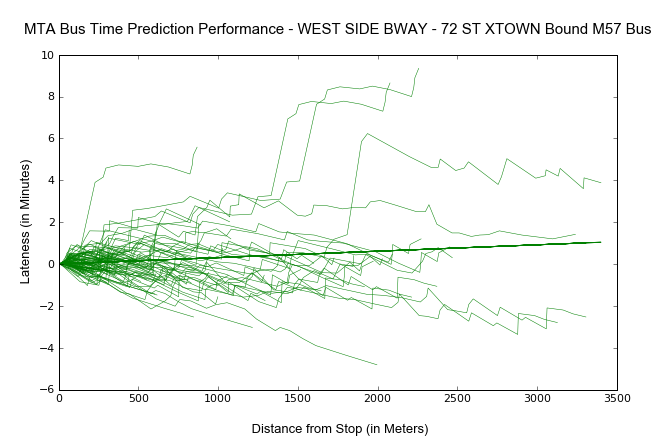

M60%2B - LA GUARDIA AIRPORT:
Set of Stop Arrival Predictions Collected: 81
Incremental Lateness in Seconds per Kilometer: 22.79
95% Confidence Interval of Incremental Lateness: [21.53, 24.05]


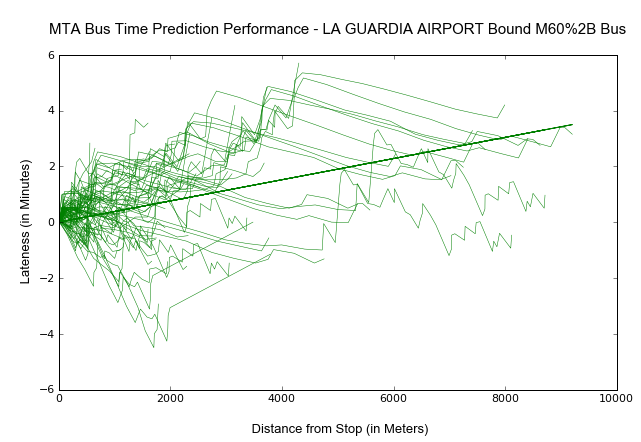

M60%2B - WEST SIDE BWAY - 106 ST:
Set of Stop Arrival Predictions Collected: 83
Incremental Lateness in Seconds per Kilometer: 4.1
95% Confidence Interval of Incremental Lateness: [3.36, 4.84]


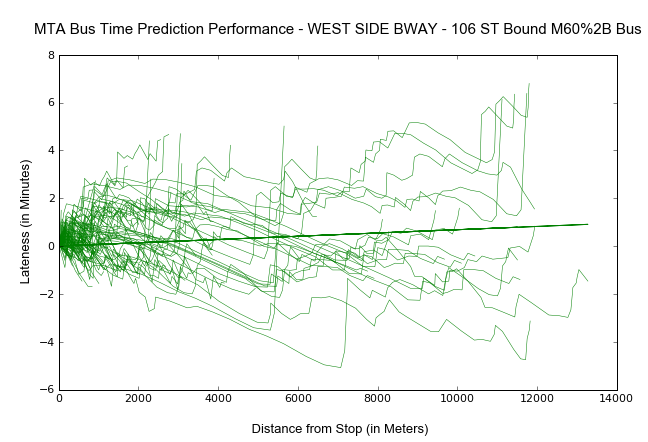

M66 - EAST SIDE YORK AV CROSSTOWN:
Set of Stop Arrival Predictions Collected: 110
Incremental Lateness in Seconds per Kilometer: 19.98
95% Confidence Interval of Incremental Lateness: [18.18, 21.77]


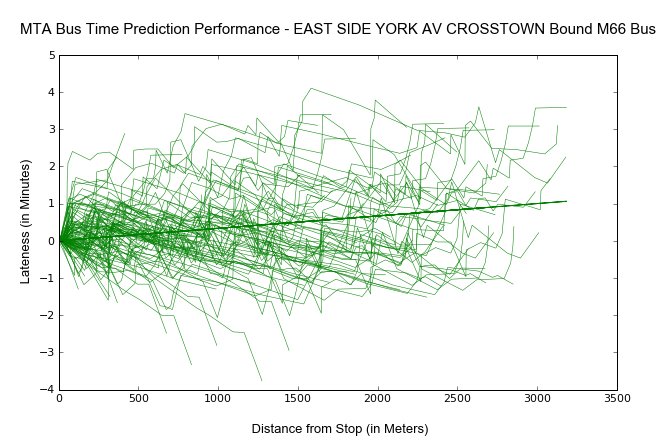

M66 - LINCOLN CTR WEST END AV XTOWN:
Set of Stop Arrival Predictions Collected: 99
Incremental Lateness in Seconds per Kilometer: 38.12
95% Confidence Interval of Incremental Lateness: [34.91, 41.34]


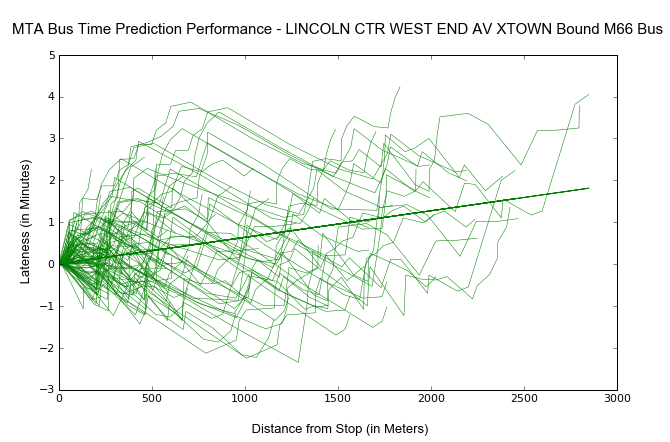

M72 - EAST SIDE YORK AV CROSSTOWN:
Set of Stop Arrival Predictions Collected: 119
Incremental Lateness in Seconds per Kilometer: 41.44
95% Confidence Interval of Incremental Lateness: [39.66, 43.23]


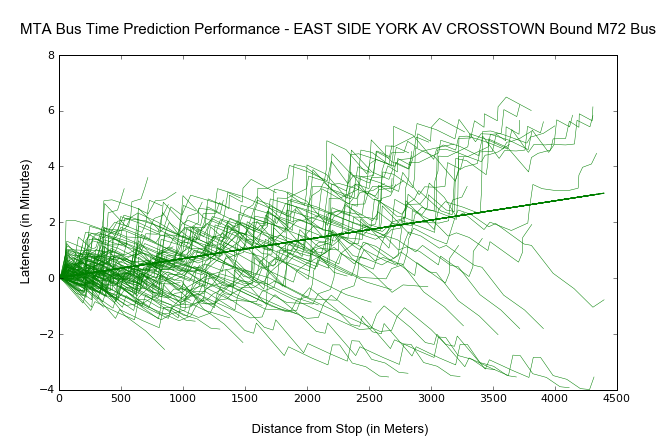

M72 - WEST SIDE FREEDOM PL XTOWN:
Set of Stop Arrival Predictions Collected: 101
Incremental Lateness in Seconds per Kilometer: 19.47
95% Confidence Interval of Incremental Lateness: [17.88, 21.05]


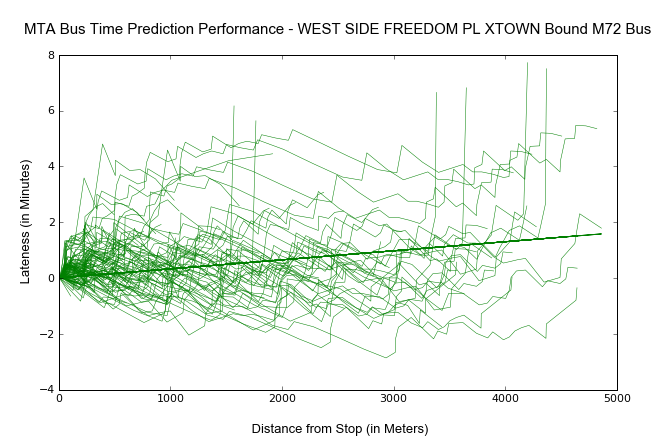

M79 - YORKVILLE EAST END AV CROSSTOWN:
Set of Stop Arrival Predictions Collected: 120
Incremental Lateness in Seconds per Kilometer: 42.09
95% Confidence Interval of Incremental Lateness: [39.22, 44.95]


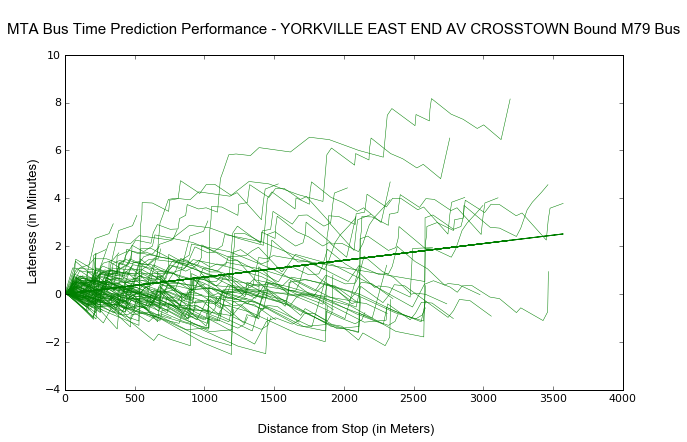

M79 - WEST SIDE-RIVERSIDE DR CROSSTOWN:
Set of Stop Arrival Predictions Collected: 114
Incremental Lateness in Seconds per Kilometer: 10.78
95% Confidence Interval of Incremental Lateness: [8.63, 12.93]


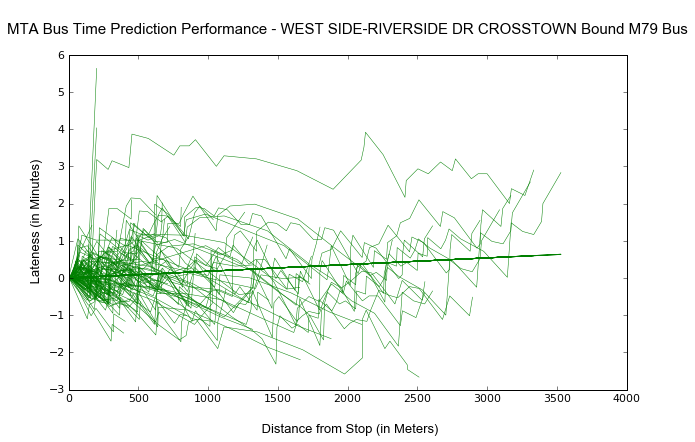

M86%2B - Select Bus Service Yorkville East End AV:
Set of Stop Arrival Predictions Collected: 191
Incremental Lateness in Seconds per Kilometer: 35.27
95% Confidence Interval of Incremental Lateness: [32.64, 37.89]


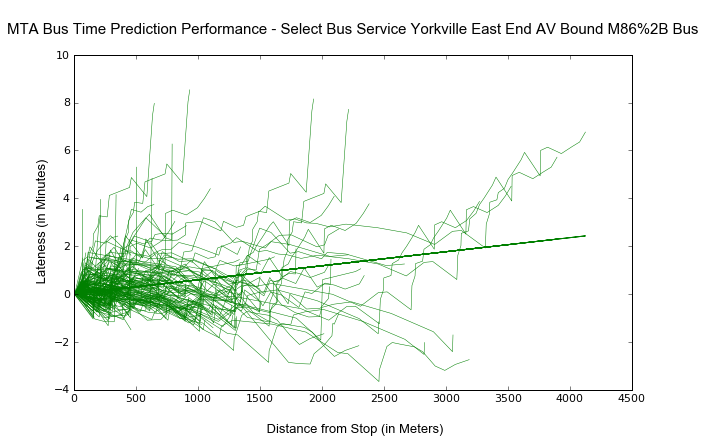

M86%2B - Select Bus Service Westside West End AV:
Set of Stop Arrival Predictions Collected: 157
Incremental Lateness in Seconds per Kilometer: 11.97
95% Confidence Interval of Incremental Lateness: [9.64, 14.3]


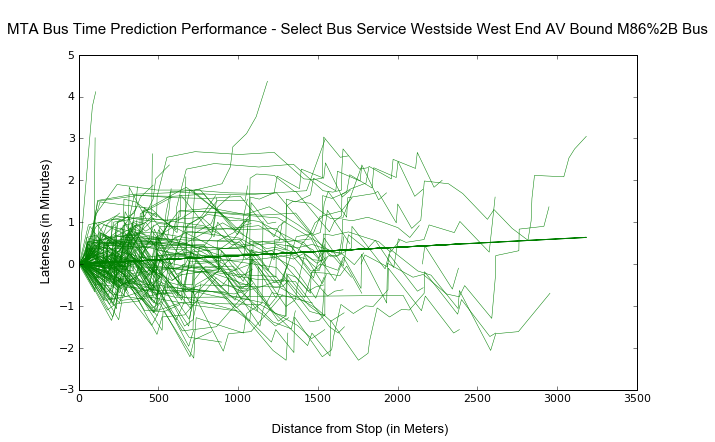

M96 - EAST SIDE 1 AV CROSSTOWN:
Set of Stop Arrival Predictions Collected: 116
Incremental Lateness in Seconds per Kilometer: 21.42
95% Confidence Interval of Incremental Lateness: [19.07, 23.76]


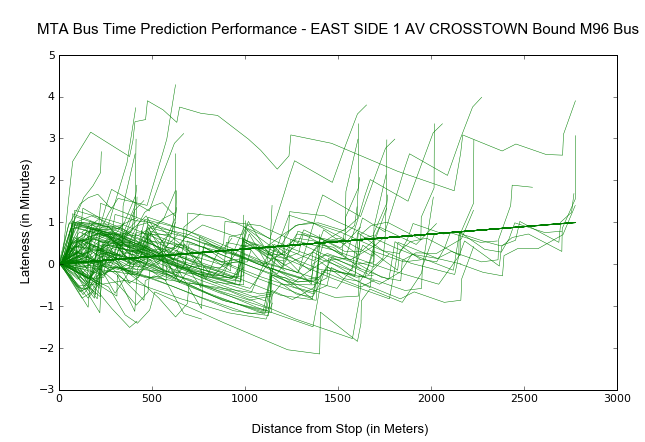

M96 - WEST SIDE WEST END AV CROSSTOWN:
Set of Stop Arrival Predictions Collected: 132
Incremental Lateness in Seconds per Kilometer: 12.87
95% Confidence Interval of Incremental Lateness: [10.99, 14.75]


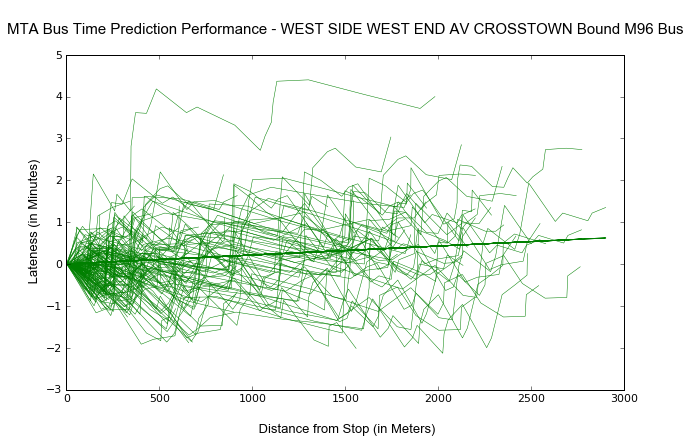

M100 - INWOOD 220 ST via AMSTERDAM via BWAY:
Set of Stop Arrival Predictions Collected: 126
Incremental Lateness in Seconds per Kilometer: -17.59
95% Confidence Interval of Incremental Lateness: [-18.54, -16.64]


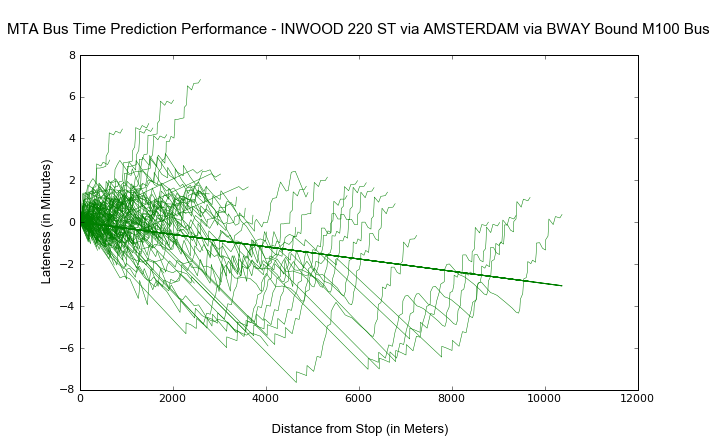

M100 - E HARLM 1 AV-125 ST via BDWY via AMSTRDM:
Set of Stop Arrival Predictions Collected: 140
Incremental Lateness in Seconds per Kilometer: 8.65
95% Confidence Interval of Incremental Lateness: [7.97, 9.33]


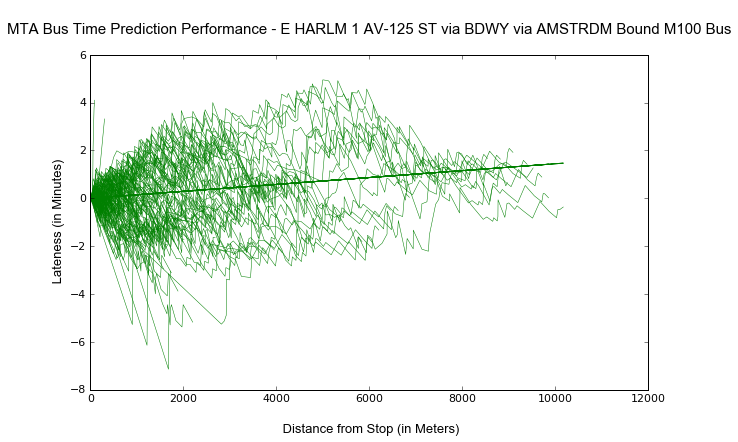

M101 - FT GEORGE 193 ST via 3 AV:
Set of Stop Arrival Predictions Collected: 29
Incremental Lateness in Seconds per Kilometer: 66.81
95% Confidence Interval of Incremental Lateness: [61.82, 71.8]


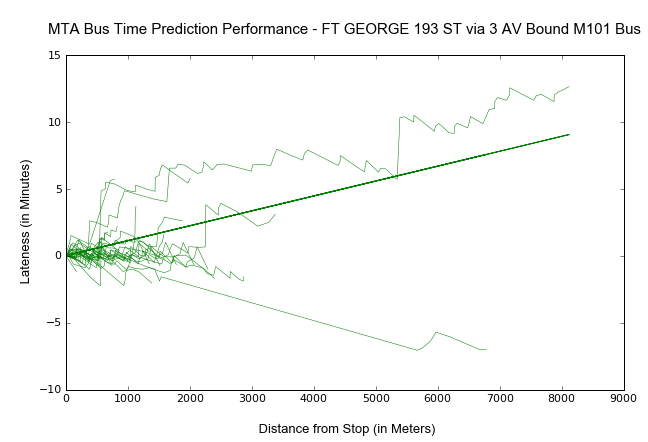

M101 - EAST VILLAGE 6 ST via LEX AV:
Set of Stop Arrival Predictions Collected: 56
Incremental Lateness in Seconds per Kilometer: 58.1
95% Confidence Interval of Incremental Lateness: [53.31, 62.89]


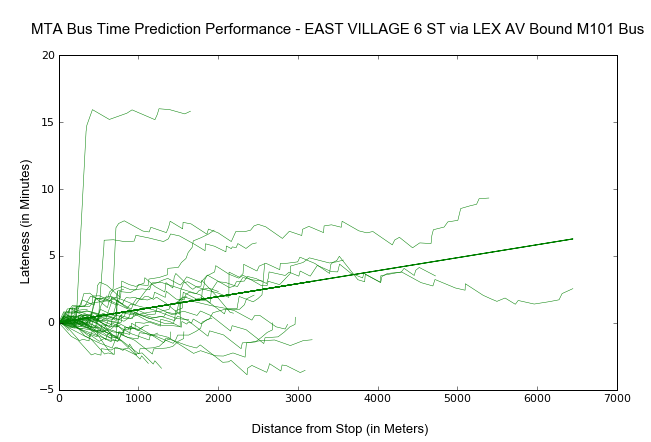

M102 - HARLEM 147 ST via 3 AV:
Set of Stop Arrival Predictions Collected: 64
Incremental Lateness in Seconds per Kilometer: 24.6
95% Confidence Interval of Incremental Lateness: [21.37, 27.83]


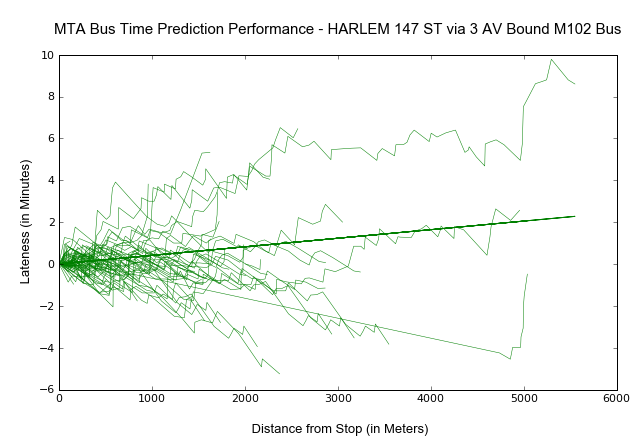

M102 - EAST VIL 6 ST via LEX AV:
Set of Stop Arrival Predictions Collected: 37
Incremental Lateness in Seconds per Kilometer: 16.11
95% Confidence Interval of Incremental Lateness: [12.88, 19.35]


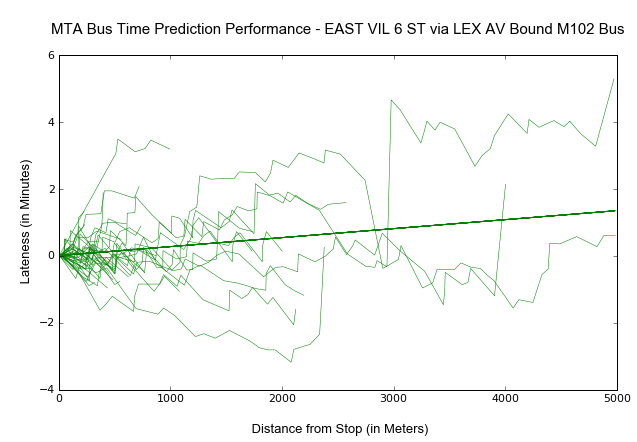

M103 - E HARLEM 125 ST via 3 AV:
Set of Stop Arrival Predictions Collected: 88
Incremental Lateness in Seconds per Kilometer: 41.85
95% Confidence Interval of Incremental Lateness: [40.74, 42.97]


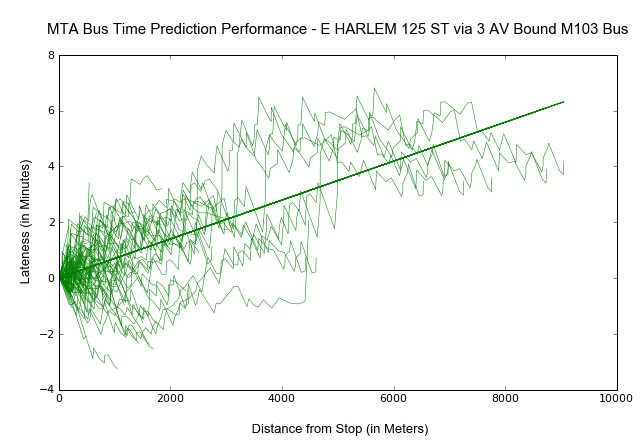

M103 - CITY HALL via LEX AV:
Set of Stop Arrival Predictions Collected: 132
Incremental Lateness in Seconds per Kilometer: -0.41
95% Confidence Interval of Incremental Lateness: [-2.01, 1.19]


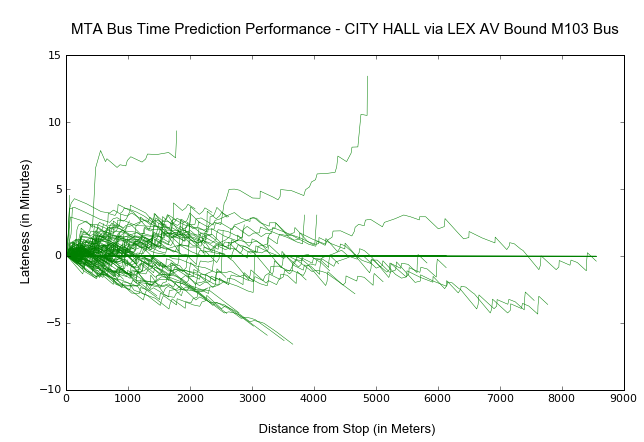

M104 - W HARLEM 129 ST via BWAY:
Set of Stop Arrival Predictions Collected: 307
Incremental Lateness in Seconds per Kilometer: 19.64
95% Confidence Interval of Incremental Lateness: [18.06, 21.22]


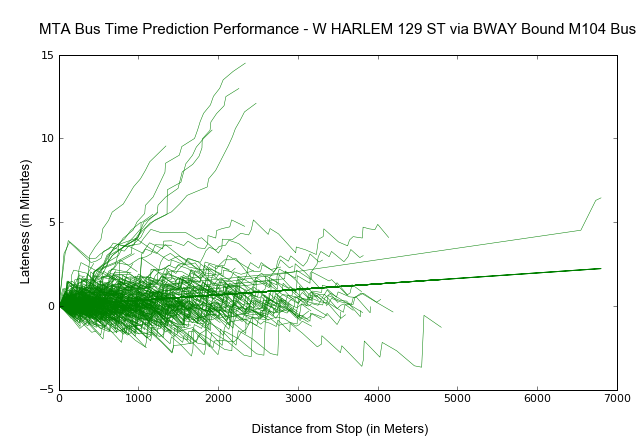

M104 - 41 ST via BROADWAY/7 AV:
Set of Stop Arrival Predictions Collected: 208
Incremental Lateness in Seconds per Kilometer: -21.56
95% Confidence Interval of Incremental Lateness: [-22.9, -20.22]


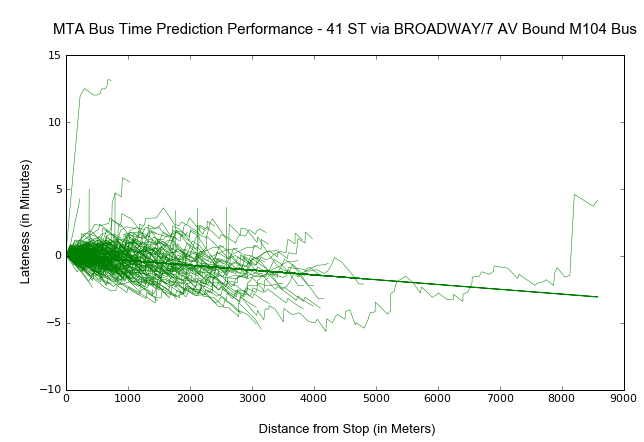

M116 - E. HARLEM PALADINO AV XTOWN:
Set of Stop Arrival Predictions Collected: 113
Incremental Lateness in Seconds per Kilometer: 58.54
95% Confidence Interval of Incremental Lateness: [54.34, 62.73]


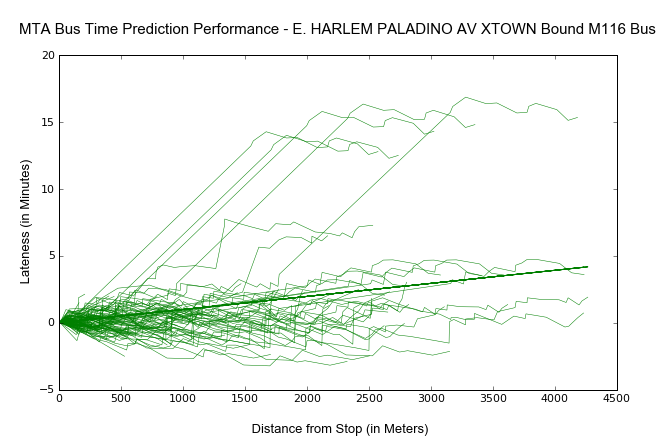

M116 - WEST SIDE BWAY - 106 ST XTOWN:
Set of Stop Arrival Predictions Collected: 148
Incremental Lateness in Seconds per Kilometer: 16.56
95% Confidence Interval of Incremental Lateness: [14.04, 19.08]


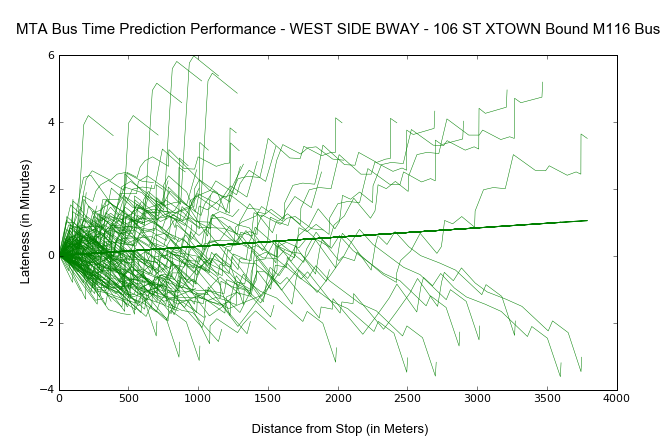

In [218]:
for x,y,z in zip(all_lines,directions,all_terminal_stops):
    plotLineData(all_bus_data,x,y,'2016-02-15 10:00:00','2016-02-15 19:00:00',z,200,5)

What may be even more useful in evaluating prediction times however, is analyzing by bus stops rather than buses themselves.

In [99]:
def getBusStopRealTimeData(stop_code,line_code):
    prefix = 'http://bustime.mta.info/api/siri/stop-monitoring.json?'
    key = '5347ec91-8b26-42ab-9b06-0dc84d71eabf'
    version = '2'
    operatingref = 'MTA'   
    detail = 'calls'
    url = prefix + 'key=' + key + '&version=' + version + '&OperatingRef=' + operatingref + \
          '&LineRef=MTA%20NYCT_' + line_code + '&MonitoringRef=' + stop_code + '&StopMonitoringDetailLevel=' + detail
    data = urllib.urlopen(url).read()
    
    return json.loads(data)

In [111]:
stop_data = getBusStopRealTimeData('403240','M42')
stop_data['Siri']['ServiceDelivery']['StopMonitoringDelivery'][0]['MonitoredStopVisit'][0]

{u'MonitoredVehicleJourney': {u'Bearing': 337.18814,
  u'BlockRef': u'MTA NYCT_MQ_A6-Saturday_A_MQ_22920_M42-3',
  u'DestinationName': [u'UN - 1 AV CROSSTOWN'],
  u'DestinationRef': u'MTA_903046',
  u'DirectionRef': u'0',
  u'FramedVehicleJourneyRef': {u'DataFrameRef': u'2016-02-13',
   u'DatedVehicleJourneyRef': u'MTA NYCT_MQ_A6-Saturday-081900_M42_4'},
  u'JourneyPatternRef': u'MTA_M420116',
  u'LineRef': u'MTA NYCT_M42',
  u'Monitored': True,
  u'MonitoredCall': {u'ArrivalProximityText': u'approaching',
   u'DistanceFromStop': 32,
   u'ExpectedArrivalTime': u'2016-02-13T13:53:24.862-05:00',
   u'ExpectedDepartureTime': u'2016-02-13T13:53:24.862-05:00',
   u'NumberOfStopsAway': 0,
   u'StopPointName': [u'W 42 ST/7 AV'],
   u'StopPointRef': u'MTA_403240',
   u'VisitNumber': 1},
  u'OnwardCalls': {u'OnwardCall': [{u'ArrivalProximityText': u'approaching',
     u'DistanceFromStop': 32,
     u'ExpectedArrivalTime': u'2016-02-13T13:53:24.862-05:00',
     u'ExpectedDepartureTime': u'2016-02

In [19]:
master_data['MTA NYCT_5225_W 42 ST/11 AV']

[[297, datetime.datetime(2016, 2, 13, 16, 8, 6)],
 [152, datetime.datetime(2016, 2, 13, 16, 8, 18)],
 [12, datetime.datetime(2016, 2, 13, 16, 8, 43)],
 [8, datetime.datetime(2016, 2, 13, 16, 9, 13)],
 [8, datetime.datetime(2016, 2, 13, 16, 9, 43)],
 [8, datetime.datetime(2016, 2, 13, 16, 10, 14)]]

In [38]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib import rcParams
import seaborn as sns

sns.set_style("whitegrid")
sns.set_context("poster")

def remove_border(axes=None, top=False, right=False, left=True, bottom=True):
    """
    Minimize chartjunk by stripping out unnecesasry plot borders and axis ticks
    
    The top/right/left/bottom keywords toggle whether the corresponding plot border is drawn
    """
    ax = axes or plt.gca()
    ax.spines['top'].set_visible(top)
    ax.spines['right'].set_visible(right)
    ax.spines['left'].set_visible(left)
    ax.spines['bottom'].set_visible(bottom)
    
    #turn off all ticks
    ax.yaxis.set_ticks_position('none')
    ax.xaxis.set_ticks_position('none')
    
    #now re-enable visibles
    if top:
        ax.xaxis.tick_top()
    if bottom:
        ax.xaxis.tick_bottom()
    if left:
        ax.yaxis.tick_left()
    if right:
        ax.yaxis.tick_right()
        
pd.set_option('display.width', 1000)
pd.set_option('display.max_columns', 100)
import warnings
warnings.filterwarnings('ignore', message='Polyfit*')

In [75]:
a = [1,2]
zip(a,a)

[(1, 1), (2, 2)]

In [113]:
x = [[1]]
x.append([2])
x

[[1], [2]]

In [187]:
x = np.array([1,2,3])
sum(x > 0)

3

In [190]:
final_data = all_bus_data['M100_1']
#final_data[(final_data['Difference in Seconds'] > 300) & (final_data['Distance in Meters'] < 1000)]
final_data.iloc[401:425]

,Vehicle and Stop,Distance in Meters,Difference in Seconds,Predicted Arrival,Actual Arrival
401,MTA NYCT_8365_1 AV/125 ST,954,712,2016-02-15 16:39:53,2016-02-15 16:51:45
402,MTA NYCT_8365_1 AV/125 ST,923,696,2016-02-15 16:40:09,2016-02-15 16:51:45
403,MTA NYCT_8365_1 AV/125 ST,906,672,2016-02-15 16:40:33,2016-02-15 16:51:45
404,MTA NYCT_8365_1 AV/125 ST,486,797,2016-02-15 16:38:28,2016-02-15 16:51:45
405,MTA NYCT_8365_1 AV/125 ST,457,748,2016-02-15 16:39:17,2016-02-15 16:51:45
406,MTA NYCT_8365_1 AV/125 ST,246,830,2016-02-15 16:37:55,2016-02-15 16:51:45
407,MTA NYCT_8365_1 AV/125 ST,213,818,2016-02-15 16:38:07,2016-02-15 16:51:45
408,MTA NYCT_8365_1 AV/125 ST,140,830,2016-02-15 16:37:55,2016-02-15 16:51:45
409,MTA NYCT_8365_1 AV/125 ST,125,807,2016-02-15 16:38:18,2016-02-15 16:51:45
410,MTA NYCT_8365_1 AV/125 ST,123,776,2016-02-15 16:38:49,2016-02-15 16:51:45


In [243]:
x = scrape_data['M42_0']['MTA NYCT_6723_RIVERSIDE DR/W 82 ST']
start = 0
end = 0
stuff = []
for i,prediction in enumerate(x):
    if i != 0 and x[i-1][0] < prediction[0]:
        actual_arrival_time = prediction[1]
        end = i
        print start,end
        for block in x[start:end]:
            distance = block[0]
            delta = actual_arrival_time - block[1]
            diff = delta.total_seconds()
            stuff.append(['MTA NYCT_6685_BROADWAY/W 171 ST',distance,diff,block[1],actual_arrival_time]) 
            start = end+1

0 58
59 70
71 115
116 135


We need to figure out a way to get the directions of each lines. The goal is to find the terminal stop and call it "that"-bound.

In [173]:
for bus_line, frame in all_bus_data.iteritems():
    frame.to_pickle(bus_line)

In [225]:
toc = timeit.default_timer()
toc - tic

13.251211166381836

In [12]:
import cPickle
cPickle.dump(all_scrape_data, open('save.p', 'wb')) 
obj = cPickle.load(open('save.p', 'rb'))

In [13]:
len(obj)

10

In [14]:
len(all_scrape_data)

10